# IEEE-CIS Fraud Detection
                  


<div>
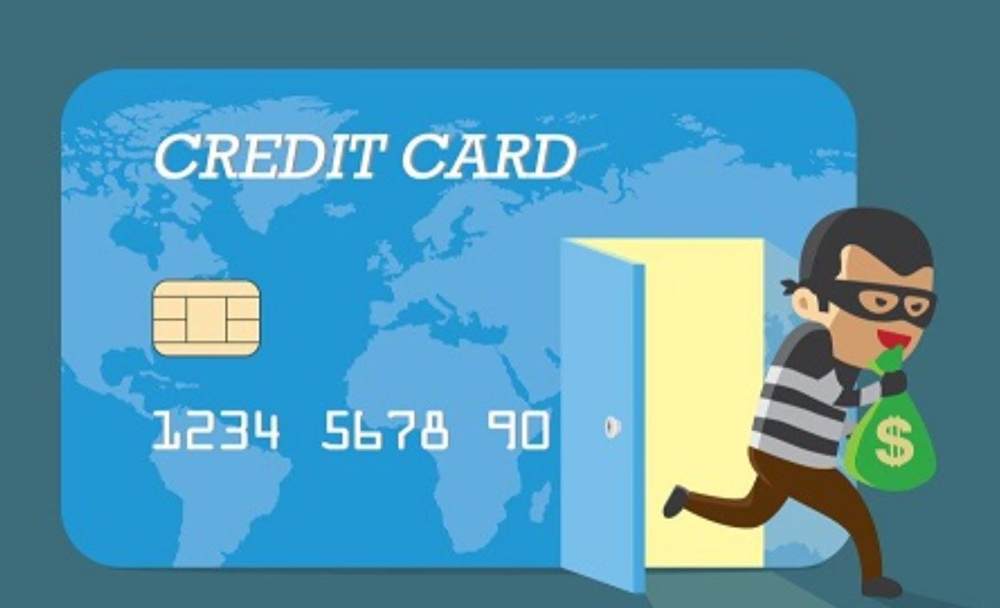
</div>

Source - https://www.kaggle.com/competitions/ieee-fraud-detection

In this kaggle competetion we need to need to predict the probabilty of transaction being fraud.

Business constraints :

1) Cost of misclassification can be high - If any legit transaction is detected to be fraud then raising the false alaram will  lead to bad customer experience.

2) Low latency requirements - If there is any kind of fraud transaction, it should immediately get caught so that the card can be blocked by company.

3) Interpretability - Should know the proability of transaction being fraud and non-fraud.

4) Performance - The model should be robust to predict the transaction and legit or fraudulent with higher accuracy.


# 1. Exploratory Data Analysis (EDA)

In [1]:
import numpy as np
import pandas as pd
import pickle
import seaborn as sns
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Helper function
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [4]:
#set display option for rows & columns
pd.set_option( 'display.max_rows', None)
pd.set_option('display.max_columns', None )

Lets, first load the train and test dataset which is broken into two different dataset transaction and identity

In [5]:
# loading train transaction data
train_transaction = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Fraud-Detection/train_transaction.csv')
print(train_transaction.shape)

train_transaction = reduce_mem_usage(train_transaction)
train_transaction.head(4)

(590540, 394)
Memory usage of dataframe is 1775.15 MB
Memory usage after optimization is: 542.35 MB
Decreased by 69.4%


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [6]:
# Loading train identity data
train_identity = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Fraud-Detection/train_identity.csv')
print(train_identity.shape)

train_identity = reduce_mem_usage(train_identity)
train_identity.head(4)

(144233, 41)
Memory usage of dataframe is 45.12 MB
Memory usage after optimization is: 25.86 MB
Decreased by 42.7%


,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,52.0,NaN,Found,Found,121.0,NaN,410.0,142.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,NaN,New,NotFound,225.0,NaN,176.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN


Observation:

These two above dataframe are joined by TransactionID column.

Not all the transactions have corresponding indentity information.

The total number of datapoints in transaction dataframe(=590540) are more than number of datapoints in identity dataframe(=144233)

In [7]:
# Merging transaction and identity train data
train_df = pd.merge( train_transaction, train_identity, how ='left')

print(train_df.shape)
print("Total number of rows after merging = ", train_df.shape[0])
print("Total number of columns after merging = ",train_df.shape[1])

del train_transaction, train_identity
train_df.head(4)

(590540, 434)
Total number of rows after merging =  590540
Total number of columns after merging =  434


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0

Observation:

The train dataset consists of 590540 datapoints.

This dataset consists of 434 features. 

Few columns contain categorical data and other column has numerical datatype.

In [8]:
# loading test transaction data
test_transaction = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Fraud-Detection/test_transaction.csv')
print(test_transaction.shape)

test_transaction = reduce_mem_usage(test_transaction)
test_transaction.head(4)


(506691, 393)
Memory usage of dataframe is 1519.24 MB
Memory usage after optimization is: 472.59 MB
Decreased by 68.9%


,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,3663549,18403224,31.953125,W,10409,111.0,150.0,visa,226.0,debit,170.0,87.0,1.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,3.0,4.0,0.0,0.0,6.0,0.0,5.0,1.0,115.0,6.0,419.0,419.0,27.0,398.0,27.0,NaN,NaN,NaN,NaN,418.0,203.0,NaN,NaN,NaN,409.0,T,T,F,NaN,NaN,F,T,T,T,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,47.950001,0.0,0.0,47.950001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,47.950001,0.0,0.0,47.950001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.000000,W,4272,111.0,150.0,visa,226.0,debit,299.0,87.0,4.0,NaN,aol.com,NaN,3.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,1.0,12.0,2.0,149.0,149.0,7.0,634.0,7.0,NaN,NaN,NaN,NaN,231.0,634.0,NaN,NaN,NaN,634.0,T,F,F,M0,NaN,F,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1

In [10]:
# Loading test identity data
test_identity = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Fraud-Detection/test_identity.csv')
print(test_identity.shape)

test_identity = reduce_mem_usage(test_identity)
test_identity.head(4)


(141907, 41)
Memory usage of dataframe is 44.39 MB
Memory usage after optimization is: 25.44 MB
Decreased by 42.7%


,TransactionID,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,id-10,id-11,id-12,id-13,id-14,id-15,id-16,id-17,id-18,id-19,id-20,id-21,id-22,id-23,id-24,id-25,id-26,id-27,id-28,id-29,id-30,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663586,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,100.0,NotFound,27.0,NaN,New,NotFound,225.0,15.0,427.0,563.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
1,3663588,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,Found,NaN,-300.0,Found,Found,166.0,NaN,542.0,368.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Android 6.0.1,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T
2,3663597,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,-360.0,New,NotFound,225.0,NaN,271.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0
3,3663601,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,27.0,NaN,Found,Found,225.0,15.0,427.0,563.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13


In [11]:
#merging test transaction and identity table
test_df = pd.merge(test_transaction, test_identity, how='left')

print(test_df.shape)
print("Total number of rows after merging = ", test_df.shape[0])
print("Total number of columns after merging = ",test_df.shape[1])

del test_transaction, test_identity
test_df.head(4)


(506691, 433)
Total number of rows after merging =  506691
Total number of columns after merging =  433


,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,id-10,id-11,id-12,id-13,id-14,id-15,id-16,id-17,id-18,id-19,id-20,id-21,id-22,id-23,id-24,id-25,id-26,id-27,id-28,id-29,id-30,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663549,18403224,31.953125,W,10409,111.0,150.0,visa,226.0,debit,170.0,87.0,1.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,3.0,4.0,0.0,0.0,6.0,0.0,5.0,1.0,115.0,6.0,419.0,419.0,27.0,398.0,27.0,NaN,NaN,NaN,NaN,418.0,203.0,NaN,NaN,NaN,409.0,T,T,F,NaN,NaN,F,T,T,T,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,47.950001,0.0,0.0,47.950001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,47.950001,0.0,0.0,47.950001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.000000,W,4272,111.0,150.0,visa,226.0,debit,299.0,87.0,4.0,NaN,aol.com,NaN,3.0,2.0

Observations:

Total number of columns in test dataset = 506691

The number of features in train dataset = 433

We need to find out is_fraud columns values for test dataset points



In [12]:
#checking for final rows and column details

print(train_df.info())
print("==============================================================")
print(test_df.info())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 590540 entries, 0 to 590539
Columns: 434 entries, TransactionID to DeviceInfo
dtypes: float16(354), float32(45), int16(1), int32(2), int8(1), object(31)
memory usage: 650.5+ MB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 506691 entries, 0 to 506690
Columns: 433 entries, TransactionID to DeviceInfo
dtypes: float16(346), float32(53), int16(1), int32(2), object(31)
memory usage: 565.4+ MB
None


In [13]:
#Train data column count and their values
print("Total number of columns are:",train_df.shape[1])
print("="*50)
print("The train features are:" , train_df.columns.tolist())

Total number of columns are: 434
The train features are: ['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', '

In [14]:
#Test data column count and their values
print("Total number of columns are:",test_df.shape[1])
print("="*50)
print("The test features are:" , test_df.columns.tolist())

Total number of columns are: 433
The test features are: ['TransactionID', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75',

Observation:

There is one column less in test data set compared to train data set, i.e. isFraud whose values needs to be predicted for test dataset.

Also, the id column names have underscore(_) in it, lets replace it with - to maintain uniformity. 

In [15]:
test_df.columns = test_df.columns.str.replace('^id-', 'id_', regex=True)
#df.columns = df.columns.str.replace('$', '')
print(test_df.columns.tolist())

['TransactionID', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83',

In [16]:
#Features datatypes & features count based on their datatype

print(train_df.dtypes)
print("**************************************************")
print("Features counts - ", train_df.dtypes.astype(str).value_counts())


TransactionID       int32
isFraud              int8
TransactionDT       int32
TransactionAmt    float16
ProductCD          object
card1               int16
card2             float16
card3             float16
card4              object
card5             float16
card6              object
addr1             float16
addr2             float16
dist1             float16
dist2             float16
P_emaildomain      object
R_emaildomain      object
C1                float16
C2                float16
C3                float16
C4                float16
C5                float16
C6                float16
C7                float16
C8                float16
C9                float16
C10               float16
C11               float16
C12               float16
C13               float16
C14               float16
D1                float16
D2                float16
D3                float16
D4                float16
D5                float16
D6                float16
D7                float16
D8          

In [17]:
# Duplicates check in train data
print(train_df.duplicated().sum())

# Duplicates check in test data
print(test_df.duplicated().sum())

0
0


Observation:

There are no dupicated rows neither in train data nor in test data.

In [18]:
#check the values pattern for all features
for col, values in train_df.iteritems():

    num_uniques = values.nunique()

    print ('{name}: {num_unique}'.format(name = col, num_unique = num_uniques ))

    print (values.unique())
    print ('-------\n')

TransactionID: 590540
[2987000 2987001 2987002 ... 3577537 3577538 3577539]
-------

isFraud: 2
[0 1]
-------

TransactionDT: 573349
[   86400    86401    86469 ... 15811079 15811088 15811131]
-------

TransactionAmt: 8195
[  68.5   29.    59.  ... 1731.   174.1 1660. ]
-------

ProductCD: 5
['W' 'H' 'C' 'S' 'R']
-------

card1: 13553
[13926  2755  4663 ... 13166  8767 18038]
-------

card2: 500
[ nan 404. 490. 567. 514. 555. 360. 100. 111. 352. 375. 418. 303. 314.
 543. 583. 148. 321. 269. 361. 272. 399. 569. 453. 417. 512. 545. 266.
 114. 481. 452. 547. 383. 170. 343. 556. 285. 562. 302. 264. 558. 500.
 396. 103. 206. 143. 243. 476. 199. 174. 423. 446. 492. 523. 440. 528.
 161. 535. 354. 117. 455. 325. 158. 268. 122. 479. 147. 215. 480. 265.
 388. 408. 309. 415. 414. 437. 104. 225. 101. 134. 586. 191. 491. 369.
 322. 494. 532. 313. 474. 324. 475. 298. 429. 432. 553. 566. 599. 296.
 251. 310. 242. 204. 250. 270. 346. 316. 194. 587. 390. 135. 536. 254.
 226. 327. 420. 260. 413. 428. 56

In [19]:
#percentage of missing data in train and test dataset
 
missig_rate = np.product(train_df.isnull().sum().sum()) / np.product(train_df.shape) * 100
print(f'Missing value in train data = {missig_rate:.2f}%')


missig_rate = np.product(test_df.isnull().sum().sum()) / np.product(test_df.shape) * 100
print(f'Missing value in test data = {missig_rate:.2f}%')


Missing value in train data = 45.07%
Missing value in test data = 41.11%


In [20]:
def missing_info(column, df):
    
    '''
        Function to find the missing values
        of feature in the dataframe.
    '''
    
    na = df[column].isna()

    count = na.sum()
    total_count = df.shape[0]
    miss_prcntage = np.round(( count/total_count)*100, 3 )
    
    return (count, miss_prcntage)

In [21]:
def missing_train_info(df):
    '''
        Function to get info. regarding missing values in the dataframe, 
        for each column.
       
            - No. of missing values present in a column.
            - % of missing values in a column.
    '''
    
    column_missing_info = [ ]
    
    for column in df :

        count , miss_prcntage = missing_info(column, df);
        
        if(count):

            column_missing_info.append( [column, count, miss_prcntage] )
      
    column_names = [ 'Feature', 'Missing_Count', 'Missing_Percentage' ]
    missing_info_df = pd.DataFrame( data = column_missing_info , columns = column_names)
    
    return missing_info_df

In [22]:
#missing values based on features along with their respective count and percentage

missing_train_df = missing_train_info(train_df)

missing_train_df.sort_values(by=['Missing_Percentage'], ascending=False)

,Feature,Missing_Count,Missing_Percentage
397,id_24,585793,99.196
398,id_25,585408,99.131
380,id_07,585385,99.127
381,id_08,585385,99.127
399,id_26,585377,99.126
394,id_21,585381,99.126
400,id_27,585371,99.125
396,id_23,585371,99.125
395,id_22,585371,99.125
8,dist2,552913,93.628


In [24]:
#Check numerical features in dataset

#numeric_data = train_df.select_dtypes(include=[np.number])
#numeric_data

In [23]:
#Categorical features and the count

def getCatFeatureDetail( df,cat_cols ):

    cat_detail_dict = { } 
    for col in cat_cols:

        cat_detail_dict[col] = df[col].nunique()

    cat_detail_df = pd.DataFrame.from_dict(cat_detail_dict, orient = 'index', columns = ['nunique'])

    print('We Have ' + str(len(cat_cols)) + ' categorical columns.')

    print(cat_detail_df)
    
categorical_feature = ['isFraud','ProductCD','addr1', 'addr2', 'P_emaildomain','R_emaildomain','DeviceType','DeviceInfo']
all_cat_features = categorical_feature+ [f'card{i}' for i in range(1,7)]+ [f'M{i}' for i in range(1,10)] + [f'id_{i}' for i in range(12,39)]
    
getCatFeatureDetail(train_df, categorical_feature)

We Have 8 categorical columns.
               nunique
isFraud              2
ProductCD            5
addr1              332
addr2               74
P_emaildomain       59
R_emaildomain       60
DeviceType           2
DeviceInfo        1786


# 2.Data Analysis & Visualization on each feature

# 2.1 is_fraud
is_fraud is the numerical variable which has 2 unique value 0 and 1, where 0 indicates the legit transaction and 1 indicates the fraud transaction.

In [24]:
#isFraud datatype
train_df['isFraud'].dtype

dtype('int8')

In [25]:
#checking count of null values in isFraud column
print(train_df["isFraud"].isnull().sum())

0


In [26]:
#target varible value counts
train_df['isFraud'].value_counts()

0    569877
1     20663
Name: isFraud, dtype: int64

Text(0, 0.5, 'Percentage')

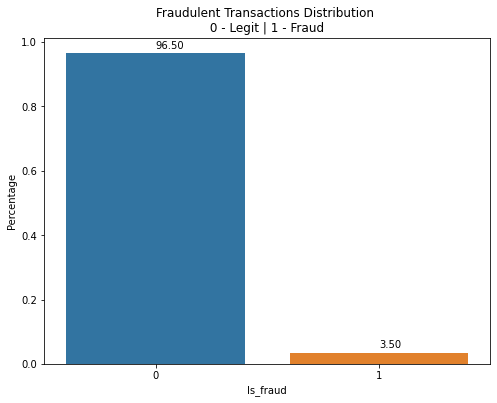

In [27]:
#bar plot 
plt.figure(figsize = (8, 6 ))
yaxis = train_df['isFraud'].value_counts().values / train_df.shape[0]
barplot = sns.barplot(x = [0,1], y = yaxis)

for p in barplot.patches:
    barplot.annotate(format(p.get_height()*100, '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), xytext = (0, 5), textcoords = 'offset points')

plt.title("Fraudulent Transactions Distribution \n 0 - Legit | 1 - Fraud ")
plt.xlabel('Is_fraud')
plt.ylabel('Percentage')

Observation(s):

1) The total no. of fraudulent transactions( equals 3.5%) present in the dataset are very less compared to the legit transactions(total = 96.5%) which indicates that the dataset here is highly imbalanced.

2) This is an important feature to keep in mind while modellling as few models get highly impacted due to imbalanced dataset.

3) We are not predicting a fraudulent transactions here. According to the competition host Lynn. Once a client (credit card) has fraud, their entire account is converted to isFraud=1. Therefore we are predicting fraudulent clients (credit cards). Reference source: https://www.kaggle.com/c/ieee-fraud-detection/discussion/111284


# 2.2 TransactionDT 
It is a numerical variable.

Represents timedelta from a given reference datetime (not an actual timestamp)



In [28]:
#datatype check
train_df['TransactionDT'].dtype

dtype('int32')

In [29]:
# No null values for this column
print(train_df["TransactionDT"].isnull().sum())

print(test_df["TransactionDT"].isnull().sum())

0
0


In [30]:
train_df["TransactionDT"].nunique()

573349

In [31]:
#TransactionDT feature description

train_df[['TransactionDT']].describe().astype(int)

,TransactionDT
count,590540
mean,7372311
std,4617223
min,86400
25%,3027057
50%,7306527
75%,11246620
max,15811131


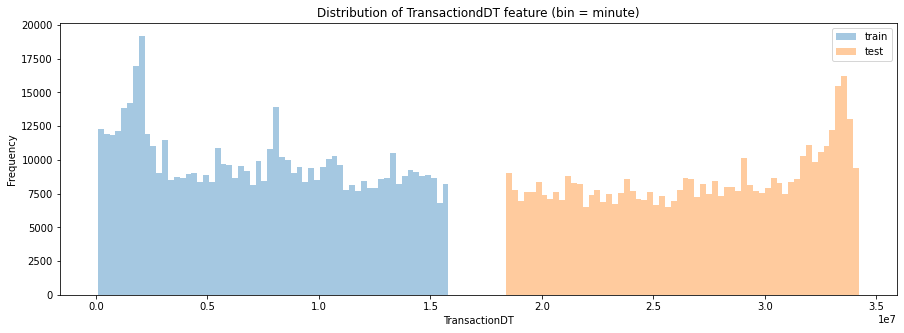

In [32]:
plt.figure(figsize = (15,5))
sns.distplot(train_df['TransactionDT'],kde = False,bins=60)
sns.distplot(test_df['TransactionDT'],kde = False,bins=60)
plt.legend(['train', 'test'])
plt.ylabel('Frequency')

plt.title('Distribution of TransactiondDT feature (bin = minute)');
plt.show()


Observations

1) TransactionDT first minimum value is 86400, which corresponds to the number of seconds in a day (60min * 60sec * 24hrs = 86400) Hence, we can consider this TransactionDT column as the time in the secs. Using this, we can conclude data spans of 6 months, since the maximum value is 15811131, which corresponds to day 183 (15811131/(60*60*24).”

- Now, once we know that this column is the time in secs, we can use this column to create new time related features i.e. time in minutes and time in hours Etc.

- Now, that we have the minimum timestamp available & hence, incidates all other transactions happened after this transaction, so if we assigne any day to week to first timestamp all the other succeeding trasanctions days can be found.

- In the same fashion the months for each transactions can be specified.

2) There is some gap between train and test timedelta. Test transactions happeded after all train transactions. Hence, we need to keep this feature in mind while spitting the data for validation. (i.e splitting the data based on time series will show good results)

3) In the initial time stamps of train transaction are high and in the last month times of test data transaction are high, Another observation is that there are certain days in which number of transactions is more than 10000.


Now, that we know transationDT is in Lets, create 2 new features from this.


- Hour
- Day

In [33]:
#day features

train_df['day'] = ((train_df['TransactionDT'] //(3600*24)-1)%7)+1

test_df['day'] = ((test_df['TransactionDT'] //(3600*24)-1)%7)+1

In [34]:
#Highest no. of transaction on day 1
print(train_df['day'].value_counts()[:1])

1    98502
Name: day, dtype: int64


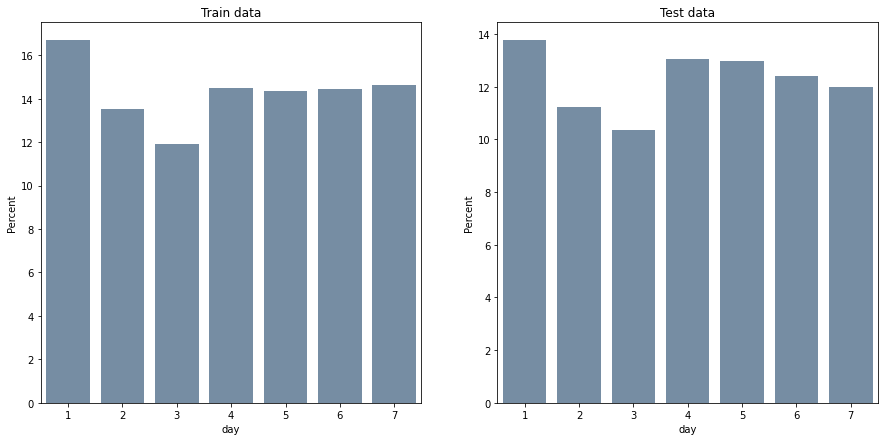

In [35]:
plt.figure(figsize = (15,7))
plt.subplot(1,2,1)
percentage = lambda i: len(i) / float(len(train_df['day'])) * 100
ax = sns.barplot(x = train_df['day'], y=train_df['day'],  estimator = percentage,color='#6E8DAB')
ax.set(ylabel = "Percent")
plt.title('Train data')

plt.subplot(1,2,2)
percentage = lambda i: len(i) / float(len(train_df['day'])) * 100
ax = sns.barplot(x = test_df['day'], y = test_df['day'],  estimator=percentage,color='#6E8DAB')
ax.set(ylabel = "Percent")
plt.title('Test data')
plt.show();

Observation:

Day 1 has more transactions compared to other days and day 3 being least

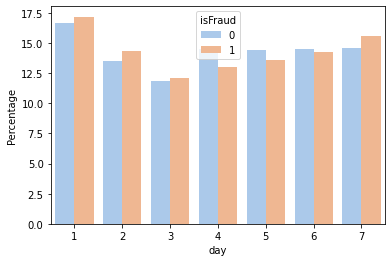

In [36]:
train_days = (train_df.groupby(['isFraud'])['day']
                     .value_counts(normalize=True)
                     .rename('Percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('day'))
sns.barplot(x="day", y = "Percentage", hue="isFraud", data = train_days, palette = 'pastel')
plt.show();

Day 1 has higher transaction frequency, both in fraud and legit transactions.

Day 1, Day 2, Day 3 and Day 7 has higher fradulent transactions, but overall there is not much difference between fraud and legit transactions in all 7 days

In [37]:
#Hour feature

train_df['hour'] = ((train_df['TransactionDT']//3600)%24)+1

test_df['hour'] = ((test_df['TransactionDT']//3600)%24)+1

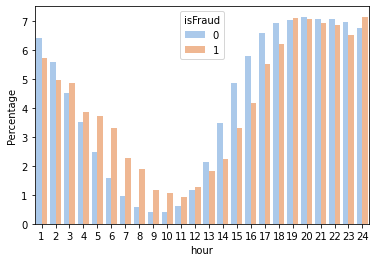

In [38]:
train_hour = (train_df.groupby(['isFraud'])['hour']
                     .value_counts(normalize = True)
                     .rename('Percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('hour'))
sns.barplot(x = "hour", y = "Percentage", hue = "isFraud", data = train_hour, palette = 'pastel')
plt.show();

We can see in the hour from 5 to 11 rate of fraud transaction is more.

From 13 to 18 rate of legit transaction is more.

With this analysis we can create a new feature.

In [39]:
def hourFeature(hour):
    if hour > 4 and hour < 12:
        return "highalert"
    if hour ==12 or hour==19:
        return "lowalert"
    if hour==3 or hour==4 or hour==24:
        return "mediumalert"
    else:
        return "noalert"

In [40]:
#Hour alert Features
train_df['hour_alertFeature'] = train_df['hour'].apply(hourFeature)

test_df['hour_alertFeature'] = test_df['hour'].apply(hourFeature)

#2.3 Transaction Amt
It is a numerical feature.

This is the amount associated with each transaction in USD.

In [41]:
train_df['TransactionAmt'].dtype

dtype('float16')

In [42]:
train_df["TransactionAmt"].nunique()

8195

In [43]:
#no null values for TransactionAmt column
print(train_df["TransactionAmt"].isnull().sum())

print(test_df["TransactionAmt"].isnull().sum())

0
0


We dont have any missing values in any of the transaction

In [44]:
print(train_df['TransactionAmt'].describe())
print("********************************")
print(test_df['TransactionAmt'].describe())


count    590540.000000
mean               NaN
std                NaN
min           0.250977
25%          43.312500
50%          68.750000
75%         125.000000
max       31936.000000
Name: TransactionAmt, dtype: float64
********************************
count    506691.000000
mean               NaN
std                NaN
min           0.018005
25%          40.000000
50%          67.937500
75%         125.000000
max       10272.000000
Name: TransactionAmt, dtype: float64


In [45]:
filt = train_df['TransactionAmt'] == 31936.000000
train_df[filt]

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,day,hour,hour_alertFeature
274336,3261336,0,6652360,31936.0,W,16075,514.0,150.0,mastercard,102.0,credit,205.0,87.0,27.0,NaN,yahoo.com,NaN,1.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,T,T,T,NaN,NaN,NaN,F,F,T,1.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1422.390015,1422.390015,1422.390015,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,1422.390015,1422.390015,1422.390015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6

Observation:


1) In train data minimum transaction amount is 0.251 and maximum amount  is 31936.

2) In test data minimum transaction amount is 0.018 and maximum amount equals 10270.0

3) Max value of train transaction Amt is much more than the test transaction Amt.
May be some of outliers are there in the train data lets take a look into it.

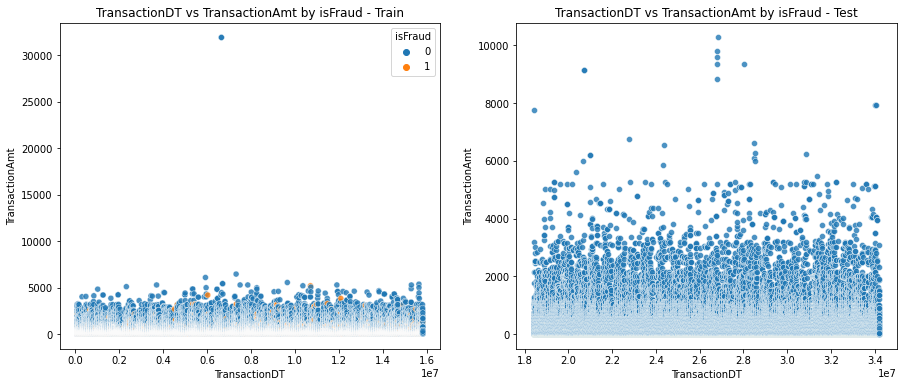

In [46]:
plt.figure(figsize = (15,6))
plt.subplot(1,2,1)
g1 = sns.scatterplot(x = "TransactionDT", y = "TransactionAmt", hue = "isFraud", data = train_df, alpha = 0.8, hue_order = [0,1])

plt.title('TransactionDT vs TransactionAmt by isFraud - Train')
plt.subplot(1,2,2)
sns.scatterplot(x = "TransactionDT",y="TransactionAmt", data=test_df, alpha=0.8, hue_order = [0,1])

plt.title('TransactionDT vs TransactionAmt by isFraud - Test')
plt.show()


In [48]:
#checking outliers datapoints
train_df[train_df.TransactionAmt > 30000]


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,day,hour,hour_alertFeature
274336,3261336,0,6652360,31936.0,W,16075,514.0,150.0,mastercard,102.0,credit,205.0,87.0,27.0,NaN,yahoo.com,NaN,1.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,T,T,T,NaN,NaN,NaN,F,F,T,1.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1422.390015,1422.390015,1422.390015,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,1422.390015,1422.390015,1422.390015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6

There are only two transactions with amount larger than $30,000 and they look like duplicated, thus we can remove them to avoid overfitting. (e.g. in tree-based models the leaf nodes might use them as samples)

Notice -  We won't be removing the rows in test dataframe as it will be used to predict target varible Y.

In [49]:
#removing outliers from original train
train_df = train_df[train_df['TransactionAmt'] < 30000]


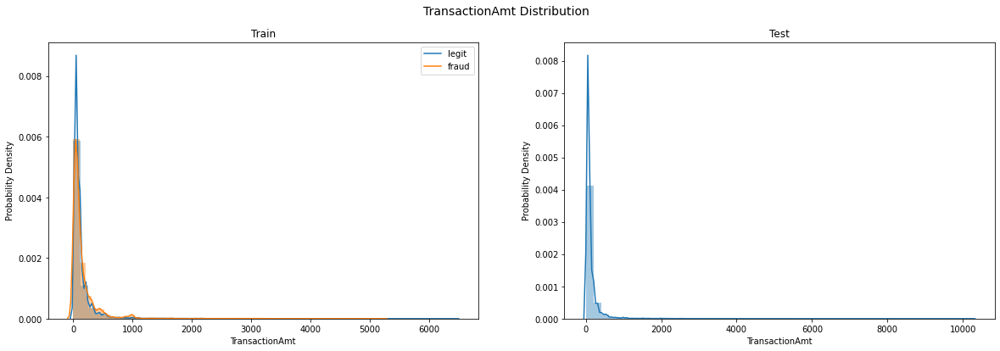

In [50]:
plt.figure(figsize = (20,6))

plt.subplot(1,2,1)

sns.distplot(train_df[train_df['isFraud']==0]['TransactionAmt'])
sns.distplot(train_df[train_df['isFraud']==1]['TransactionAmt'])
plt.ylabel('Probability Density')
plt.legend(['legit','fraud'])
plt.title('Train')

plt.suptitle('TransactionAmt Distribution' , fontsize = 14)


plt.subplot(1,2,2)

sns.distplot(test_df['TransactionAmt'])
plt.ylabel('Probability Density')
plt.title('Test')
plt.show()

Observations:

1) Most of the points in the train and test data for TransactionAmt are less than 10000

2) The distribution of the TransactionAmt is like a skewed distribution. 

3) Due to the some extreme high values in TransactionAmt, we should take a log of this amount and create a new featue to better visualize it. 
Hence, lets take log of the TransactionAmt which might be like gaussion distribution.










In [51]:
train_df['LogTransactionAmt'] = np.log(train_df['TransactionAmt'])

test_df['LogTransactionAmt'] = np.log(test_df['TransactionAmt'])

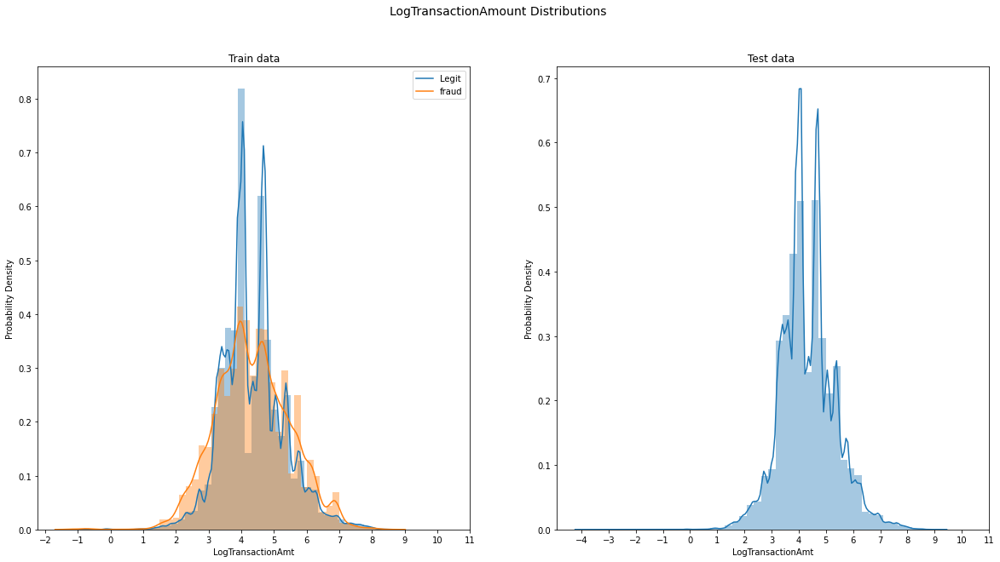

In [52]:
plt.figure(figsize = (20,10))

plt.subplot(1,2,1)

sns.distplot(train_df[train_df['isFraud'] == 0]['LogTransactionAmt'])
sns.distplot(train_df[train_df['isFraud'] == 1]['LogTransactionAmt'])

plt.xticks(np.arange(-2, 12, 1))

plt.ylabel('Probability Density')
plt.legend(['Legit','fraud'])
plt.title('Train data')

plt.suptitle('LogTransactionAmount Distributions' , fontsize = 14)


plt.subplot(1,2,2)

sns.distplot(test_df['LogTransactionAmt'])
plt.xticks(np.arange(-4, 12, 1))
plt.ylabel('Probability Density')
plt.title('Test data ')

plt.show();

Observations:

1) Log of TransactionAmt has more separating power than transactionAmt.

2) As we can see that plot overlaps but logTransactionAmt after 5.3 and before 3 have higher frequency being fraudulent.

3) And logTransactionAmt from 3 to 5.3 have higher chance it is legit transaction.



#2.4 Product CD
This is a categorical variable.

This is the product code associated with each transaction.

In [53]:
train_df["ProductCD"].dtype

dtype('O')

In [54]:
train_df["ProductCD"].nunique()

5

In [55]:
print(train_df["ProductCD"].isnull().sum())
print(test_df["ProductCD"].isnull().sum())

0
0


In [56]:
train_df["ProductCD"].value_counts()

W    439668
C     68519
R     37699
H     33024
S     11628
Name: ProductCD, dtype: int64

Observations:

Majority of the transactions have ProductCD "W", "C" and "R"



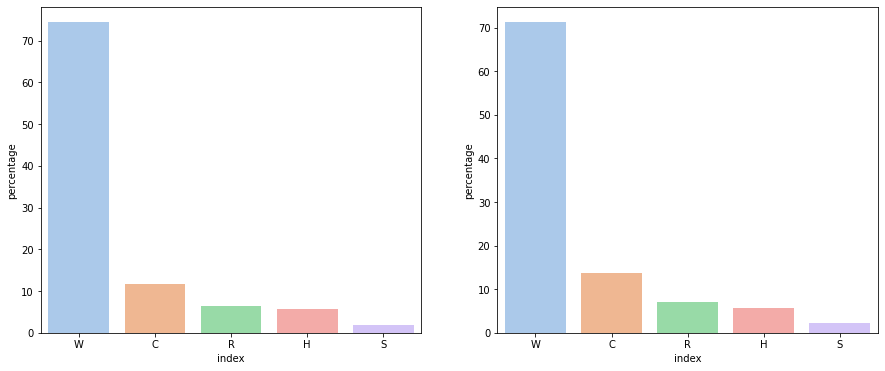

In [57]:
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
train_ProductCD = train_df['ProductCD'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x = "index", y = "percentage", data=train_ProductCD, palette = 'pastel')

plt.subplot(1,2,2)
test_ProductCD =test_df['ProductCD'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x = "index", y = "percentage", data = test_ProductCD, palette = 'pastel')

plt.show();

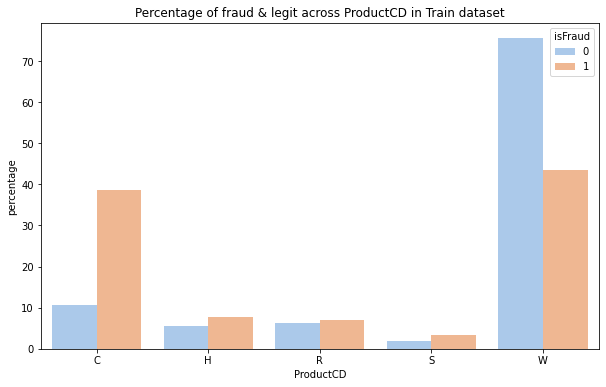

In [58]:

plt.figure(figsize = (10,6))

train_ProductCD = (train_df.groupby(['isFraud'])['ProductCD'].value_counts(normalize = True).rename('percentage').mul(100).reset_index().sort_values('ProductCD'))

sns.barplot(x = "ProductCD", y = "percentage", hue = "isFraud", data = train_ProductCD, palette = 'pastel')

plt.title('Percentage of fraud & legit across ProductCD in Train dataset')

plt.show();


Observations:

1) From the graph above we can see that if the transaction is fraudulent, there is around 40% chance it's Product C.Considering that only 10% are Legit transaction in C, chances of transaction being fraudent are high if it belongs to product C.

2) Majority of the transactions have been done for the ProductCD "W" in both train and test datasets.

Transactions whose productCD is C,H,R,S are more likely to be fraudulent transactions

3) Even though, the no. of transactions having ProductCD "C" are too less as compared to the number of transactions having ProductCD "W", the number of fraudulent transactions are almost similar in both the categories.

#2.5 Card1 - Card6
It is given that these features are categorical. Even though some appear numeric

These features represents payment card information, such as card type, card category, issue bank, country, etc.



In [59]:
#card feature data types
card_features = ['card1','card2','card3','card4','card5','card6']
for i in card_features:
  
  print(train_df[i].dtype)

int16
float16
float16
object
float16
object


In [60]:
#null values check
train_df[["card1","card2","card3","card4","card5","card6"]].isnull().sum()

card1       0
card2    8933
card3    1565
card4    1577
card5    4259
card6    1571
dtype: int64

As we can see the count of null values in card feature is 0 only for card 1 feature.

In [61]:
#card values
cards = [col for col in train_df.columns if 'card' in col]
train_df[cards].head()

,card1,card2,card3,card4,card5,card6
0,13926,NaN,150.0,discover,142.0,credit
1,2755,404.0,150.0,mastercard,102.0,credit
2,4663,490.0,150.0,visa,166.0,debit
3,18132,567.0,150.0,mastercard,117.0,debit
4,4497,514.0,150.0,mastercard,102.0,credit


In [62]:
#unique value count
for col in cards:
    print( col+'  : ' + str(train_df[col].nunique()))

card1  : 13553
card2  : 500
card3  : 114
card4  : 4
card5  : 119
card6  : 4


In [63]:
for col in ['card2','card3','card4','card5','card6']:
    train_df[col] = train_df.groupby(['card1'])[col].transform(lambda x: x.mode(dropna=False).iat[0])
    train_df[col].fillna(train_df[col].mode()[0], inplace = True)
    print(col+' feature has : '+str(train_df[col].isnull().sum())+' missing values')

card2 feature has : 0 missing values
card3 feature has : 0 missing values
card4 feature has : 0 missing values
card5 feature has : 0 missing values
card6 feature has : 0 missing values


In [64]:
#CARD1
print(train_df["card1"].describe())
print("**************************")
print(test_df["card1"].describe())

count    590538.000000
mean       9898.713741
std        4901.165273
min        1000.000000
25%        6019.000000
50%        9678.000000
75%       14182.750000
max       18396.000000
Name: card1, dtype: float64
**************************
count    506691.000000
mean       9957.222175
std        4884.960969
min        1001.000000
25%        6019.000000
50%        9803.000000
75%       14276.000000
max       18397.000000
Name: card1, dtype: float64


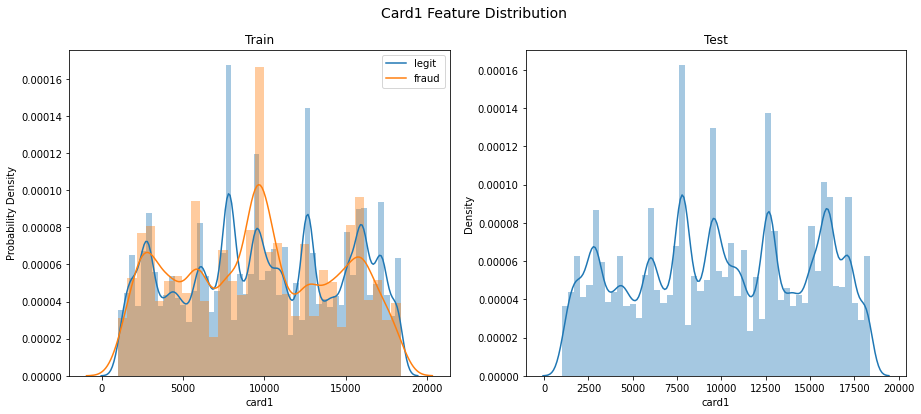

In [65]:
plt.figure(figsize = (15,6))
plt.subplot(1,2,1)

sns.distplot(train_df[train_df['isFraud'] == 0]['card1'])
sns.distplot(train_df[train_df['isFraud'] == 1]['card1'])

plt.ylabel('Probability Density')
plt.title('Train')
plt.legend(['legit','fraud'])

plt.suptitle('Card1 Feature Distribution' , fontsize = 14)


plt.subplot(1,2,2)
sns.distplot(test_df['card1'])
plt.title('Test')
plt.show()

In [66]:
#CARD2
print(train_df["card2"].describe())
print("**************************")
print(test_df["card2"].describe())

count    590538.0
mean          NaN
std           NaN
min         100.0
25%         215.0
50%         360.0
75%         512.0
max         600.0
Name: card2, dtype: float64
**************************
count    498037.0
mean          NaN
std           NaN
min         100.0
25%         207.0
50%         369.0
75%         512.0
max         600.0
Name: card2, dtype: float64


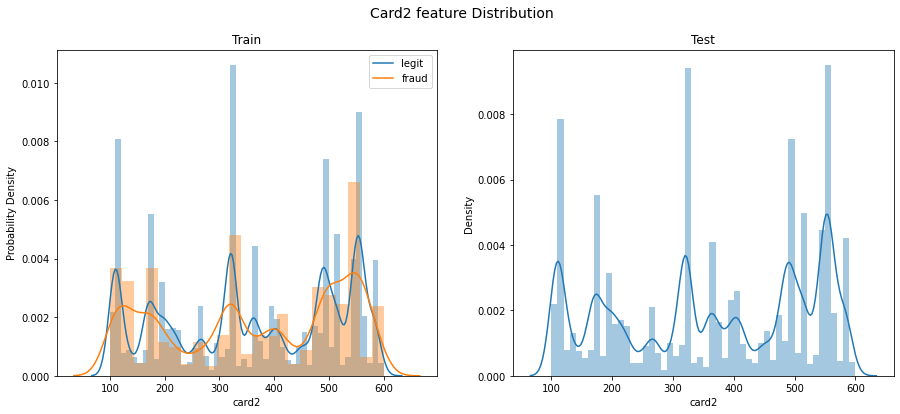

In [67]:
plt.figure(figsize = (15,6))
plt.subplot(1,2,1)

sns.distplot(train_df[(train_df['isFraud'] == 0) & (~train_df['card2'].isnull())]['card2'])
sns.distplot(train_df[(train_df['isFraud'] == 1) & (~train_df['card2'].isnull())]['card2'])

plt.ylabel('Probability Density')
plt.legend(['legit','fraud'])
plt.title('Train')

plt.suptitle('Card2 feature Distribution' , fontsize = 14)

plt.subplot(1,2,2)
sns.distplot(test_df[~test_df['card2'].isnull()]['card2'])
plt.title('Test')

plt.show();

In [68]:
#CARD3
print(train_df["card3"].describe())
print("**************************")
print(test_df["card3"].describe())

count    590538.0
mean          NaN
std           0.0
min         100.0
25%         150.0
50%         150.0
75%         150.0
max         231.0
Name: card3, dtype: float64
**************************
count    503689.0
mean          NaN
std           0.0
min         100.0
25%         150.0
50%         150.0
75%         150.0
max         232.0
Name: card3, dtype: float64


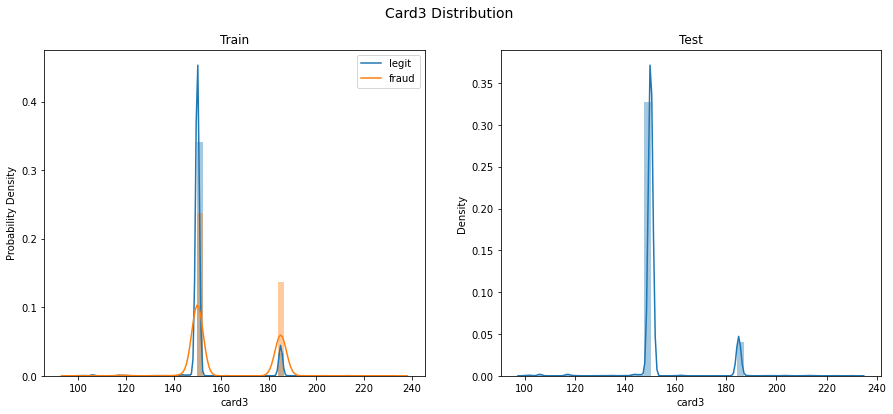

In [69]:
plt.figure(figsize = (15,6))

plt.subplot(1,2,1)

sns.distplot(train_df[(train_df['isFraud'] == 0) & (~train_df['card3'].isnull())]['card3'])
sns.distplot(train_df[(train_df['isFraud'] == 1) & (~train_df['card3'].isnull())]['card3'])

plt.ylabel('Probability Density')
plt.legend(['legit','fraud'])

plt.title('Train')

plt.suptitle('Card3 Distribution', fontsize = 14)

plt.subplot(1,2,2)
sns.distplot(test_df[~test_df['card3'].isnull()]['card3'])
plt.title('Test')

plt.show()

Observations:

1) It can be found that card3 contains only majority of 2 values only.

2) And if the value is greater than 150 around the probability of transaction being fraud increases found by the describe function.

3) We can create another feature like if the value is greater than 160 marked it as T/P(means fraud) otherwise F.

In [70]:
def new_card3(row):
    if row == np.nan:
        return row
    else:
        if row > 160:
            return 'Positive'
        else:
            return 'Negative'
        
train_df['new_card3'] = train_df['card3'].apply(new_card3)
test_df['new_card3'] = train_df['card3'].apply(new_card3)


In [71]:
train_df['card4'].value_counts()

visa                385816
mastercard          189723
american express      8328
discover              6671
Name: card4, dtype: int64

In [72]:
train_df['card4'].unique()

array(['discover', 'mastercard', 'visa', 'american express'], dtype=object)

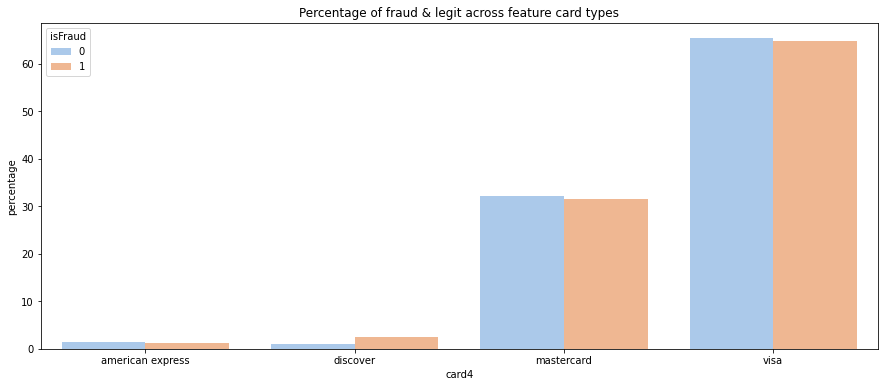

In [73]:
#card 4
plt.figure(figsize = (15, 6))
train_card4 = (train_df[~train_df['card4'].isnull()].groupby(['isFraud'])['card4'].value_counts(normalize = True).rename('percentage').mul(100).reset_index().sort_values('card4'))
sns.barplot(x = "card4", y = "percentage", hue = "isFraud", data = train_card4, palette = 'pastel')

plt.title('Percentage of fraud & legit across feature card types')

plt.show()

Observation:

1) Most of the transaction happend through visa card type and master card

2) One observation is that in fraud transaction - uses of card discover is more than the legit transaction.

3) Otherwise other cards are relatively having almost same frquency.

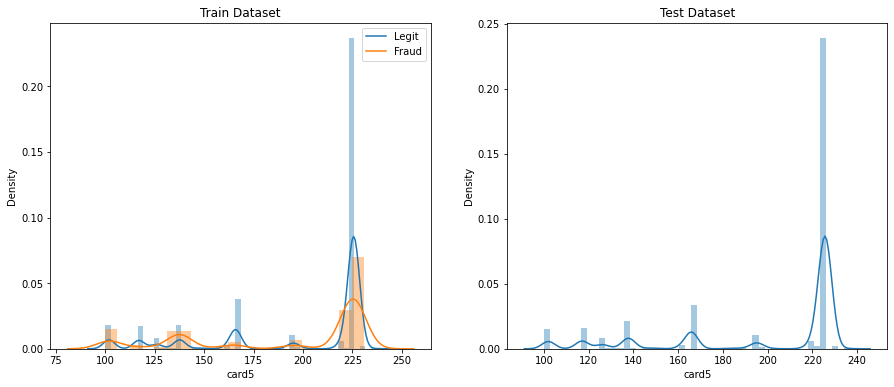

In [74]:
#card 5

plt.figure(figsize = (15,6))

plt.subplot(1,2,1)

sns.distplot(train_df[(train_df['isFraud'] == 0) & (~train_df['card5'].isnull())]['card5'])
sns.distplot(train_df[(train_df['isFraud'] == 1) & (~train_df['card5'].isnull())]['card5'])

plt.legend(['Legit','Fraud'])
plt.title('Train Dataset')

plt.subplot(1,2,2)

sns.distplot(test_df[~test_df['card5'].isnull()]['card5'])
plt.title('Test Dataset')

plt.show();

Observation:

1) There is a overlaps but in some intervals range the frquency is high for fraud and in some intervals frequency for legit transactions is high.

2) Card5 feature shows periodic nature but the frequency of points whose values lies near 220 are very high.

In [75]:
#card6

train_df["card6"].value_counts()


debit              440829
credit             149666
debit or credit        40
charge card             3
Name: card6, dtype: int64

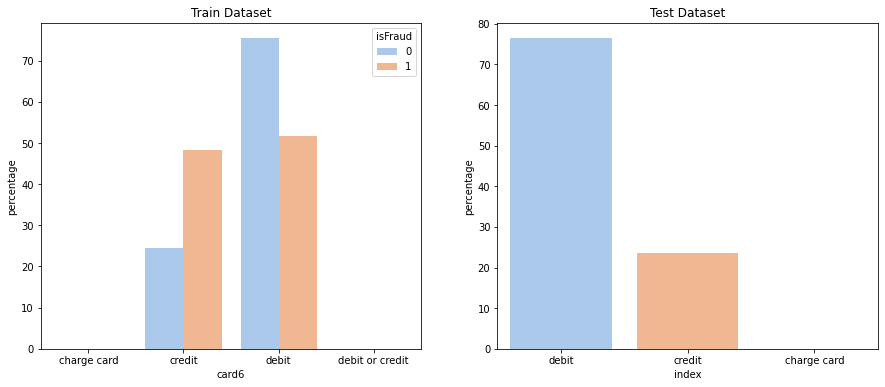

In [76]:
plt.figure(figsize = (15,6))

plt.subplot(1,2,1)
train_card6 = (train_df[~train_df['card6'].isnull()].groupby(['isFraud'])['card6']
                     .value_counts(normalize = True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('card6'))

sns.barplot(x = "card6", y = "percentage", hue = "isFraud", data = train_card6, palette = 'pastel')
plt.title('Train Dataset')
plt.subplot(1,2,2)
test_card6 =test_df[~test_df['card6'].isnull()]['card6'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x = "index", y = "percentage", data = test_card6, palette = 'pastel')

plt.title('Test Dataset')
plt.show();

Observations:

1) Debit or credit and charge card are almost 0% in the dataset. And no "debit or credit" in test data set.

2) Lets combine them in to other majority class card category.

3) Credit card transactions tends to have more fraudulent transaction then the debit card holders.



In [77]:
def replacetodbcard(row):
    if row == np.nan:
        return row
    if row == 'debit or credit' or row == 'charge card':
        return 'debit'
    else:
        return row


In [78]:
train_df['card6'] = train_df['card6'].apply(replacetodbcard)
test_df['card6'] = test_df['card6'].apply(replacetodbcard)

Observation

1) card1, card2, card3 and card5 are encoded as a numerical categorical variable and their real meaning is not that clear just by seeing the values.
and card 1 has more no. of unique values.

2) card4 feature corresponds to the type of card whereas card6 feature corresponds to the card company. Majority of card holders use "debit" cards and the most used companies are "visa" and "mastercard".

3) The percentage of fraud is higher with the "credit" cards than any other card

#2.6 addr1,addr2 

The data description states that these are categorical even though they look numeric. 
This feature is giving address information.

addr1 is the billing region(zip code).

addr2 is the billing country.

Both the address are for the purchaser.



In [79]:
address = ['addr1','addr2']

In [80]:
for i in address:
    print(train_df[i].dtype)


float16
float16


In [81]:
#checking for null values
print(' addr1 - has {} Null values'.format(train_df['addr1'].isnull().sum()))
print(' addr2 - has {} Null values'.format(train_df['addr2'].isnull().sum()))

 addr1 - has 65706 Null values
 addr2 - has 65706 Null values


In [82]:
print('There are %d regions in addr1 for Train data' % len(train_df['addr1'].value_counts()))
print(train_df['addr1'].value_counts().head(4))

print('There are %d regions in addr1 for Test data' % len(test_df['addr1'].value_counts()))
print(test_df['addr1'].value_counts().head(4))

There are 332 regions in addr1 for Train data
299.0    46335
325.0    42751
204.0    42020
264.0    39870
Name: addr1, dtype: int64
There are 292 regions in addr1 for Test data
299.0    38710
204.0    35049
325.0    34151
264.0    32710
Name: addr1, dtype: int64


In [83]:
print("Train description\n", train_df['addr1'].describe())

print("*************************")

print("Test description\n", test_df['addr1'].describe())

Train description
 count    524832.0
mean          NaN
std           NaN
min         100.0
25%         204.0
50%         299.0
75%         330.0
max         540.0
Name: addr1, dtype: float64
*************************
Test description
 count    441082.0
mean          NaN
std           NaN
min         100.0
25%         204.0
50%         299.0
75%         330.0
max         540.0
Name: addr1, dtype: float64


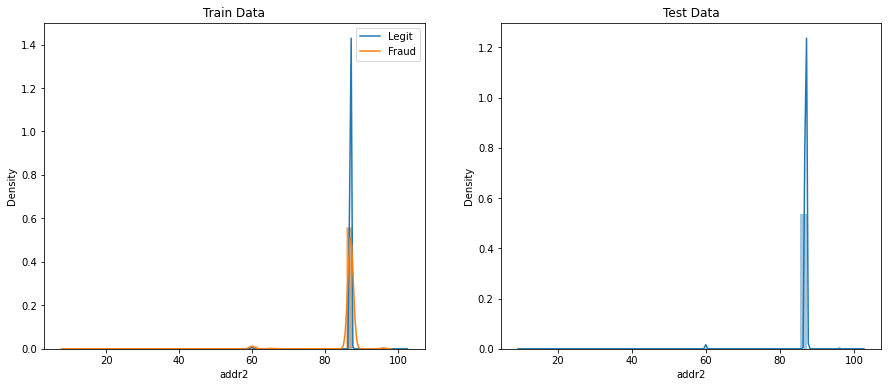

In [84]:
plt.figure(figsize = (15,6))

plt.subplot(1,2,1)

sns.distplot(train_df[(train_df['isFraud'] == 0) & (~train_df['addr2'].isnull())]['addr2'])
sns.distplot(train_df[(train_df['isFraud'] == 1) & (~train_df['addr2'].isnull())]['addr2'] )

plt.legend(['Legit','Fraud'])
plt.title('Train Data')

plt.subplot(1,2,2)

sns.distplot(test_df[~test_df['addr2'].isnull()]['addr2'])

plt.title('Test Data')
plt.show()

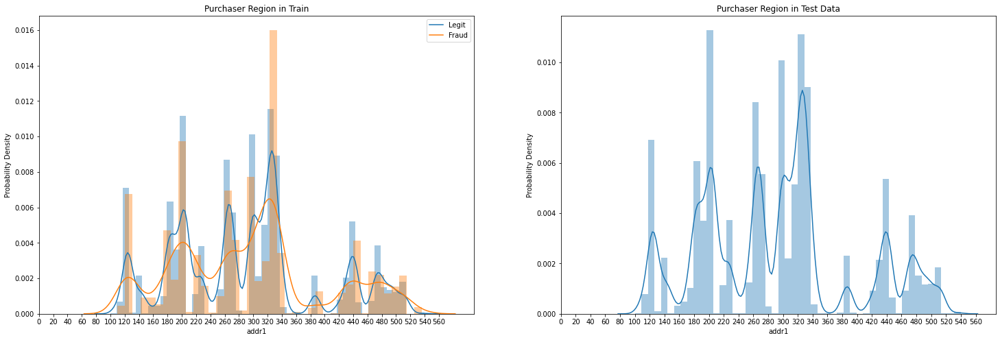

In [85]:
plt.figure(figsize = (25,8))

plt.subplot(1,2,1)

sns.distplot(train_df[(train_df['isFraud'] == 0) & (~train_df['addr1'].isnull())]['addr1'])
sns.distplot(train_df[(train_df['isFraud'] == 1) & (~train_df['addr1'].isnull())]['addr1'])

plt.legend(['Legit','Fraud'])

plt.xticks(np.arange(0, 580, 20))

plt.ylabel('Probability Density')
plt.title('Purchaser Region in Train')

plt.subplot(1,2,2)

sns.distplot(test_df[~test_df['addr1'].isnull()]['addr1'])

plt.xticks(np.arange(0, 580, 20))
plt.ylabel('Probability Density')
plt.title('Purchaser Region in Test Data')

plt.show();

Observation:

1) 330-340 seems have higher frequency of fraud.

2) In some regions fraud transactions happened more and in some other regions legit transactions happened more. So this would be an important feature in classification.




In [87]:
print('There are %d billing countries in addr2 of Train & the country 87 accounts for %.3f%%' % (len(train_df['addr2'].value_counts()), train_df['addr2'].value_counts().values[0] / len(train_df['addr2'])*100))
print(train_df['addr2'].value_counts().head(4))

print("*"*50)

print('There are %d billing countries in addr2 of Test. And the country 87 accounts for  %.3f%%' % (len(test_df['addr2'].value_counts()), test_df['addr2'].value_counts().values[0] / len(test_df['addr2'])*100))

print(test_df['addr2'].value_counts().head(4))


There are 74 billing countries in addr2 of Train & the country 87 accounts for 88.136%
87.0    520479
60.0      3084
96.0       638
32.0        91
Name: addr2, dtype: int64
**************************************************
There are 72 billing countries in addr2 of Test. And the country 87 accounts for  86.035%
87.0    435934
60.0      4041
96.0       608
32.0        61
Name: addr2, dtype: int64


Observations:

There are 74 billing countries in Train  data & 72 in test in total. The country 87 accounts for around 87% of transactions. 



In [88]:
print("Train description", train_df['addr2'].describe())

print("*************************")

print("Test description",test_df['addr2'].describe())

Train description count    524832.0
mean          NaN
std           0.0
min          10.0
25%          87.0
50%          87.0
75%          87.0
max         102.0
Name: addr2, dtype: float64
*************************
Test description count    441082.0
mean          NaN
std           0.0
min          10.0
25%          87.0
50%          87.0
75%          87.0
max         102.0
Name: addr2, dtype: float64


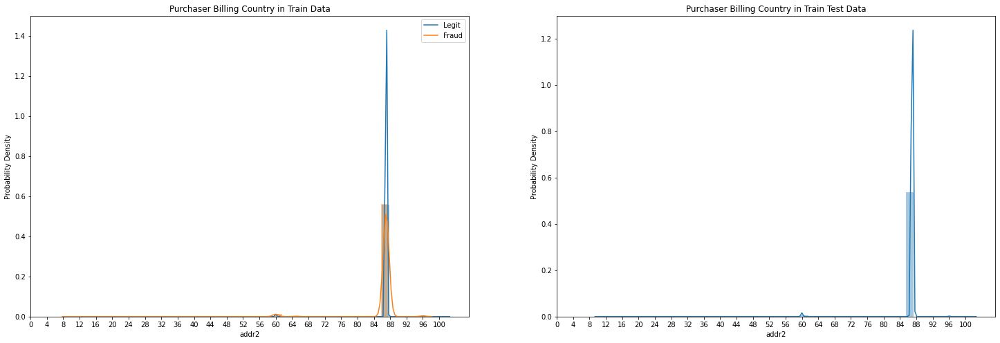

In [89]:
plt.figure(figsize = (25, 8))

plt.subplot(1,2,1)

sns.distplot(train_df[(train_df['isFraud'] == 0) & (~train_df['addr2'].isnull())]['addr2'])
sns.distplot(train_df[(train_df['isFraud'] == 1) & (~train_df['addr2'].isnull())]['addr2'])

plt.legend(['Legit','Fraud'])

plt.xticks(np.arange(0, 102, 4))

plt.ylabel('Probability Density')
plt.title('Purchaser Billing Country in Train Data')


plt.subplot(1,2,2)
sns.distplot(test_df[~test_df['addr2'].isnull()]['addr2'])
plt.xticks(np.arange(0, 102, 4))

plt.ylabel('Probability Density')
plt.title('Purchaser Billing Country in Train Test Data')

plt.show();

Observations:

1) addr1 feature corresponds to the city zip code but its value is encoded.

2) Majority transactions happened in the country whose code lies between 80 - 100 for both legit and fraud transactions and test and train data.

3) It is conclude that zip code is spread across all the values BUT most of the time country code value stick to a particular value, most of the transactions are from single country only.


#2.7 dist1,dist2 
This is the numerical data

Distance - 
"distances between (not limited) billing address, mailing address, zip code, IP address, phone area, etc.”


In [90]:
distance = ['dist1','dist2']

In [91]:
for i in distance:
    print(train_df[i].dtype)

float16
float16


In [92]:
print(train_df['dist1'].describe())
print("============================")
print(train_df['dist2'].describe())

count    238267.0
mean          NaN
std           NaN
min           0.0
25%           3.0
50%           8.0
75%          24.0
max       10288.0
Name: dist1, dtype: float64
count    37627.0
mean         inf
std          inf
min          0.0
25%          7.0
50%         37.0
75%        206.0
max      11624.0
Name: dist2, dtype: float64


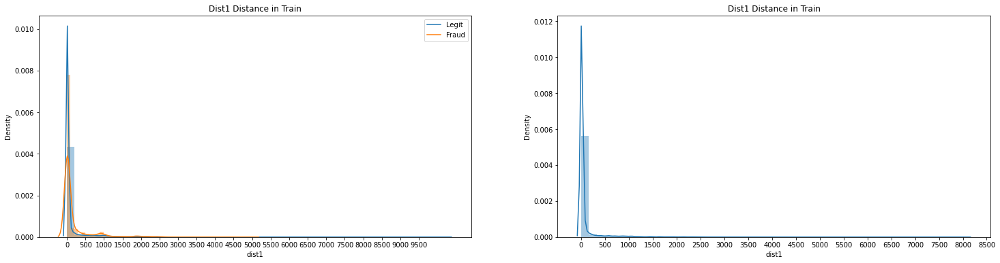

In [93]:
plt.figure(figsize = (25,6))
plt.subplot(1,2,1)
sns.distplot(train_df[(train_df['isFraud'] == 0) & (~train_df['dist1'].isnull())]['dist1'])

sns.distplot(train_df[(train_df['isFraud'] == 1) & (~train_df['dist1'].isnull())]['dist1'])

plt.legend(['Legit','Fraud'])

plt.xticks(np.arange(0, 10000, 500))
plt.title('Dist1 Distance in Train')

plt.subplot(1,2,2)
plt.xticks(np.arange(0, 10000, 500))
plt.title('Dist1 Distance in Train')
sns.distplot(test_df[~test_df['dist1'].isnull()]['dist1'])
plt.show();

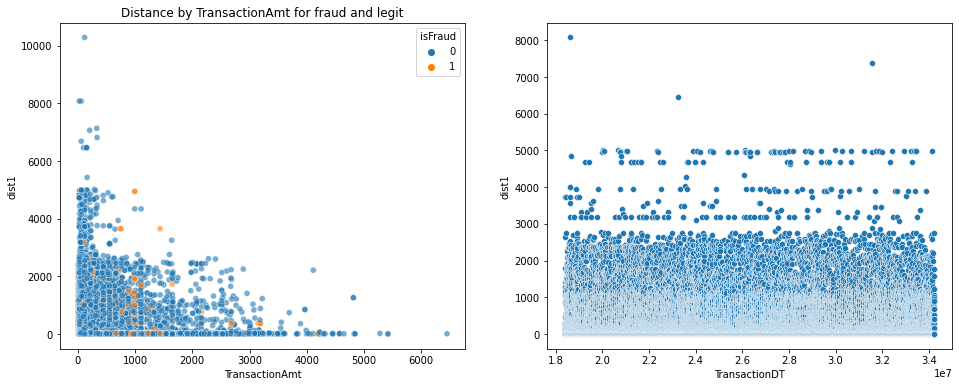

In [94]:
plt.figure(figsize = (16,6))

plt.subplot(1,2,1)

sns.scatterplot(x = "TransactionAmt", y = "dist1", hue = "isFraud",data=train_df[~train_df['dist1'].isnull()], alpha = 0.6, hue_order = [0,1])
plt.title('Distance by TransactionAmt for fraud and legit')

plt.subplot(1,2,2)
sns.scatterplot(x = "TransactionDT", y = "dist1", data=test_df[~test_df['dist1'].isnull()])
plt.show()



It's clear that observations dist1 > 6000 are outliers in Train so let's remove them

In [95]:
train_df.drop(train_df[train_df['dist1'] > 6000].index, axis=0, inplace = True)

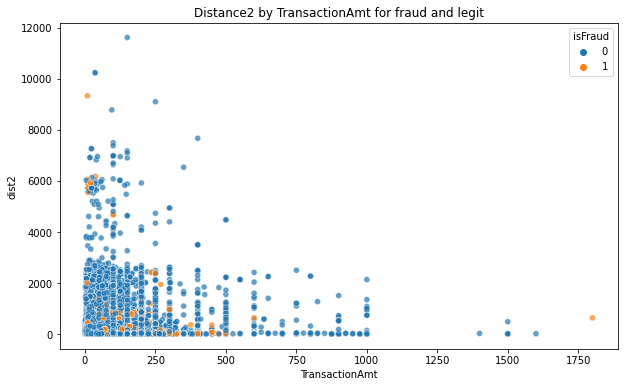

In [97]:
#dist2

plt.figure(figsize = (10,6))
sns.scatterplot(x = "TransactionAmt", y = "dist2", hue = "isFraud", data = train_df[~train_df['dist2'].isnull()], alpha = 0.7, hue_order = [0,1])
plt.title('Distance2 by TransactionAmt for fraud and legit')
plt.show()


It's clear that observations dist2 > 8000 are outliers in Train so let's remove them

In [98]:
train_df.drop(train_df[train_df['dist2'] > 8000].index, axis=0, inplace=True)

#2.8 P_email domain and R_email domain 
This is the categorical variable.

Email domain of purchaser and email domain of recipient.

In [99]:
email = ['P_emaildomain','R_emaildomain']

In [100]:
for i in email:
    print(train_df[i].dtype)

object
object


In [101]:
print(train_df['P_emaildomain'].isnull().sum())
print("=======================================")
print(train_df['R_emaildomain'].isnull().sum())



94456
453236


In [102]:
#email 
print(train_df['R_emaildomain'].value_counts())
print("================================================")
print(train_df['P_emaildomain'].value_counts().head(10))




gmail.com           57144
hotmail.com         27509
anonymous.com       20527
yahoo.com           11841
aol.com              3701
outlook.com          2507
comcast.net          1812
yahoo.com.mx         1508
icloud.com           1398
msn.com               852
live.com              762
live.com.mx           754
verizon.net           620
me.com                556
sbcglobal.net         552
cox.net               459
outlook.es            433
att.net               430
bellsouth.net         422
hotmail.fr            293
hotmail.es            292
web.de                237
mac.com               218
ymail.com             207
prodigy.net.mx        207
optonline.net         187
gmx.de                147
yahoo.fr              137
charter.net           127
mail.com              122
hotmail.co.uk         105
gmail                  95
earthlink.net          79
yahoo.de               75
rocketmail.com         69
embarqmail.com         68
scranton.edu           63
yahoo.es               57
live.fr     

Observation:

1) We can clearly see that the most common P_emaildomain used is "gmail.com".

2) The next most common email domain used for the payment is yahoo.com and the rest are comparatively having very less count.

3) As we can see we have mails from jp - japan, fr - france, de - german, uk - britain, mx - mexico, es - spain are country specific and have very less count.

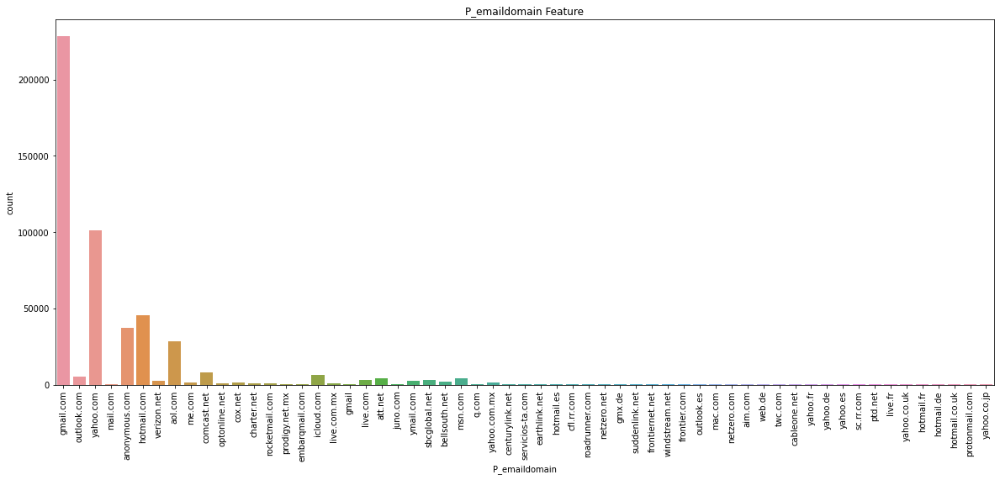

In [103]:
fig, axes = plt.subplots(nrows = 1, ncols = 1,figsize = (20,8))

sns.countplot(train_df['P_emaildomain'])
axes.title.set_text('P_emaildomain Feature')
axes.set_xticklabels(axes.get_xticklabels(), rotation = 90)

plt.show();

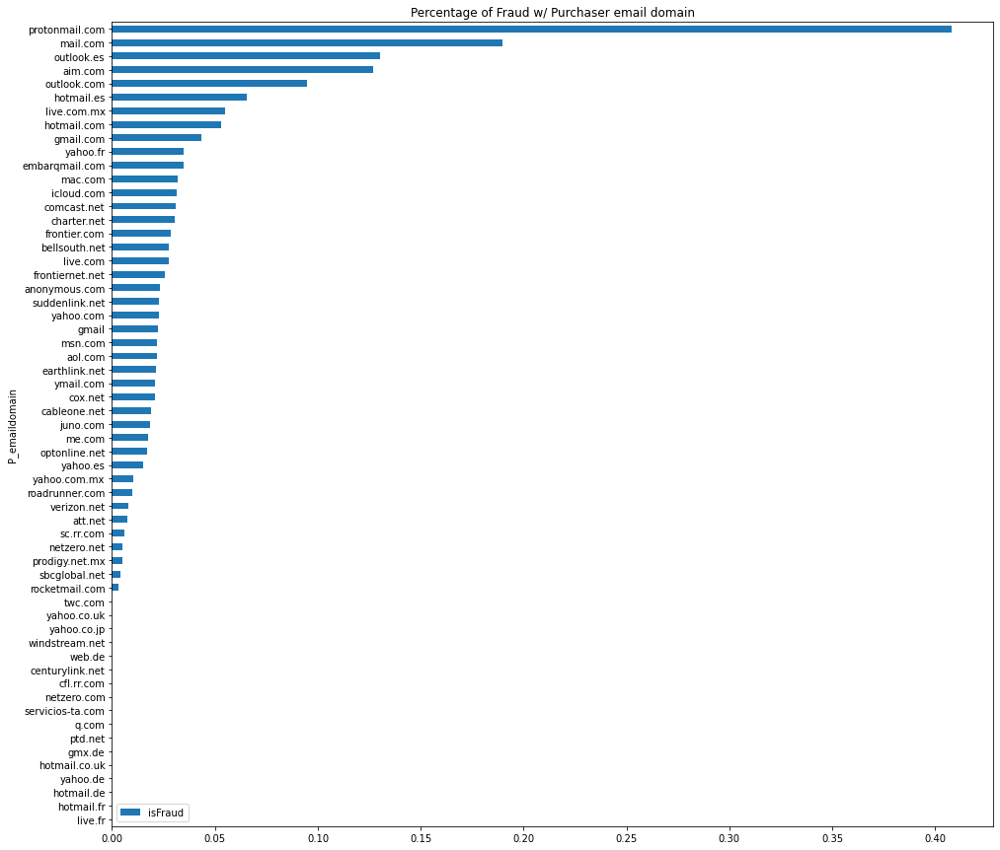

In [104]:
train_df[['P_emaildomain','isFraud']].groupby(by = ['P_emaildomain']).mean() \
        .sort_values(by = ['isFraud']).plot(kind = 'barh',
        figsize = (16, 15),
         title = 'Percentage of Fraud w/ Purchaser email domain')
plt.show()


Observation:

1) In purchaser email domains, majority of mails are from gmail.com.

2) Among those More fraud transaction are from "protonmail.com" domain which is more than around 40%.

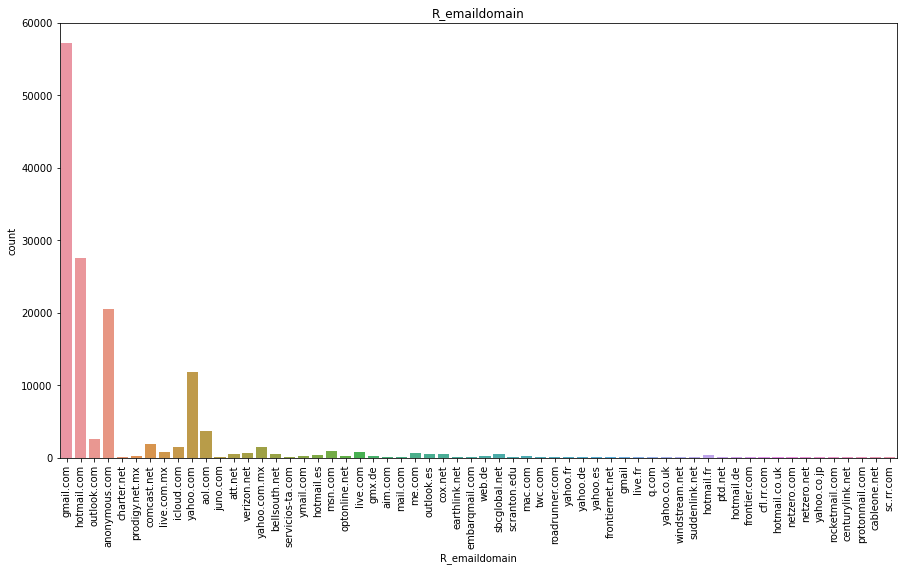

In [105]:
fig , axes = plt.subplots(nrows = 1, ncols = 1,figsize = (15, 8))

sns.countplot(train_df['R_emaildomain'])
axes.title.set_text('R_emaildomain')

axes.set_xticklabels(axes.get_xticklabels(), rotation = 90)
plt.show()

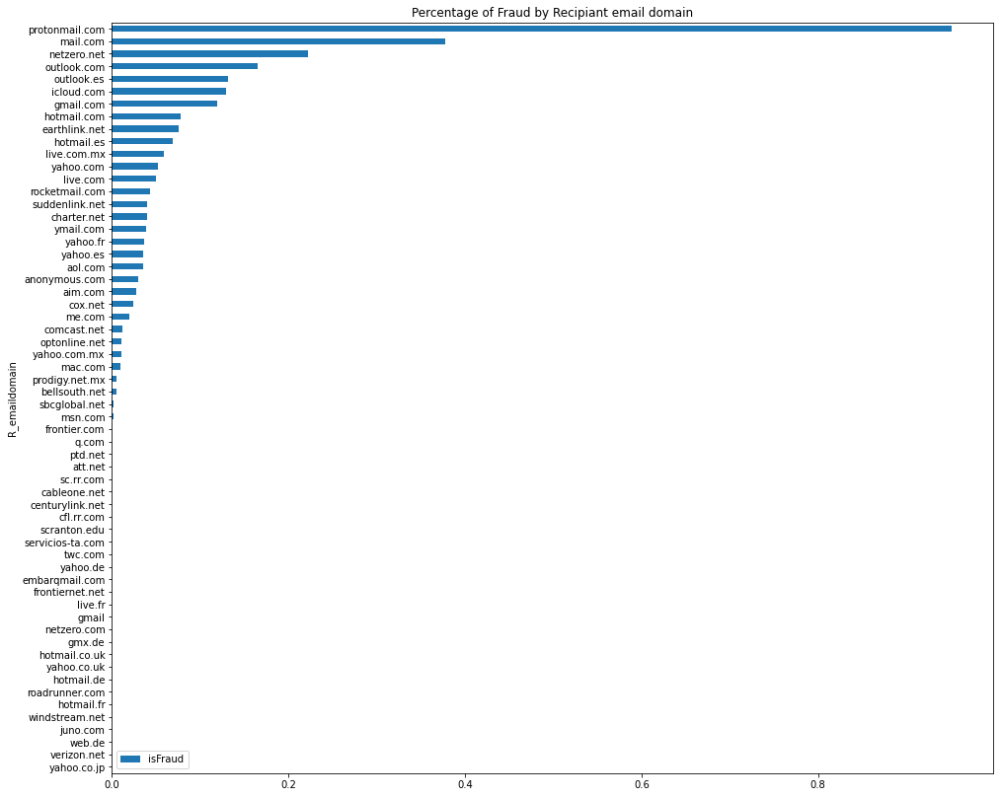

In [106]:
train_df[['R_emaildomain','isFraud']].groupby(by = ['R_emaildomain']).mean() \
        .sort_values(by = ['isFraud']).plot(kind = 'barh',
        figsize = (16, 14),
         title = 'Percentage of Fraud by Recipiant email domain')
plt.show()

Observation:

1) In purchaser email domains most mails are from gmail.com.

2) Among those More fraud transaction comes from domain protonmail.com which is more than 90% which is a serious issue.

We will group all the similar e-mail domains by the respective enterprises.

Set all values with less than 500 entries as "Others" for P_emaildomain and less than 300 as others for R_emaildomain.

Also fill NaN by 'NoInf'.

In [107]:
# Reference: https://www.kaggle.com/kabure/extensive-eda-and-modeling-xgb-hyperopt/notebook#Ploting-Transaction-Amount-Values-Distribution
train_df.loc[train_df['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'

train_df.loc[train_df['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk', 'yahoo.co.jp', 'yahoo.de', 'yahoo.fr', 'yahoo.es']), 'P_emaildomain'] = 'Yahoo'

train_df.loc[train_df['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 'hotmail.es','hotmail.co.uk', 'hotmail.de', 'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'

train_df.loc[train_df.P_emaildomain.isin(train_df.P_emaildomain.value_counts()[train_df.P_emaildomain.value_counts() <= 500 ].index), 'P_emaildomain'] = "Others"

train_df.P_emaildomain.fillna("NoInfo", inplace=True)



train_df.loc[train_df['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

train_df.loc[train_df['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk', 'yahoo.co.jp', 'yahoo.de', 'yahoo.fr', 'yahoo.es']), 'R_emaildomain'] = 'Yahoo'

train_df.loc[train_df['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 'hotmail.es','hotmail.co.uk', 'hotmail.de', 'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'

train_df.loc[train_df.R_emaildomain.isin(train_df.R_emaildomain.value_counts()[train_df.R_emaildomain.value_counts() <= 300 ].index), 'R_emaildomain'] = "Others"

train_df.R_emaildomain.fillna("NoInfo", inplace=True)

In [108]:
test_df.loc[test_df['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'

test_df.loc[test_df['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk', 'yahoo.co.jp', 'yahoo.de', 'yahoo.fr', 'yahoo.es']), 'P_emaildomain'] = 'Yahoo'

test_df.loc[test_df['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 'hotmail.es','hotmail.co.uk', 'hotmail.de', 'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'

test_df.loc[test_df.P_emaildomain.isin(test_df.P_emaildomain.value_counts()[test_df.P_emaildomain.value_counts() <= 500 ].index), 'P_emaildomain'] = "Others"

test_df.P_emaildomain.fillna("NoInfo", inplace=True)



test_df.loc[test_df['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

test_df.loc[test_df['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk', 'yahoo.co.jp', 'yahoo.de', 'yahoo.fr', 'yahoo.es']), 'R_emaildomain'] = 'Yahoo'

test_df.loc[test_df['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 'hotmail.es','hotmail.co.uk', 'hotmail.de', 'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'

test_df.loc[test_df.R_emaildomain.isin(test_df.R_emaildomain.value_counts()[test_df.R_emaildomain.value_counts() <= 300 ].index), 'R_emaildomain'] = "Others"

test_df.R_emaildomain.fillna("NoInfo", inplace=True)

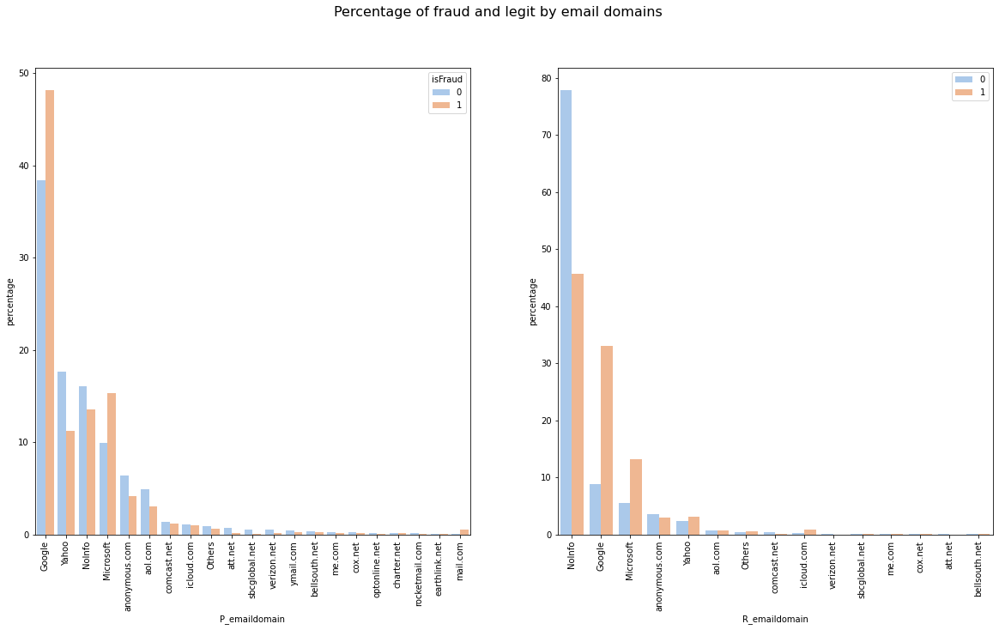

In [109]:
plt.figure(figsize=(20,10))

plt.subplot(1,2,1)

train_P_email = (train_df[~train_df['P_emaildomain'].isnull()].groupby(['isFraud'])['P_emaildomain'].value_counts(normalize=True).rename('percentage').mul(100).reset_index())
sns.barplot(x = "P_emaildomain", y = "percentage", hue = "isFraud", data = train_P_email, palette = 'pastel')
plt.xticks(rotation = 90)
plt.subplot(1,2,2)

train_R_email = train_df[~train_df['R_emaildomain'].isnull()].groupby(['isFraud'])['R_emaildomain'].value_counts(normalize=True).mul(100).rename('percentage').reset_index()
sns.barplot(x="R_emaildomain", y="percentage", hue="isFraud", data = train_R_email, palette = 'pastel')
plt.xticks(rotation=90)
plt.legend(loc = 'upper right')
plt.suptitle('Percentage of fraud and legit by email domains', fontsize = 16)

plt.show()

# 2.9 C1-C14: 

These are continous numerical features

Counts such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.
These are like count of phone numbers, email addresses, name associated with user, device, billingaddr for both purchaser and recipient that doubles the 

C1-C14 don't have any missing value in train dataset

In [110]:
C_features = ['C1','C2','C3','C4','C5','C6','C7','C8','C9','C10','C11','C12','C13','C14']

In [111]:
for i in C_features:
    print(train_df[i].dtype)


float16
float16
float16
float16
float16
float16
float16
float16
float16
float16
float16
float16
float16
float16


In [112]:
#null values in C1-C14

for i in C_features:
  nullcount = train_df[i].isnull().sum()
  print("Feature " +i+ " has", nullcount, "null values")



Feature C1 has 0 null values
Feature C2 has 0 null values
Feature C3 has 0 null values
Feature C4 has 0 null values
Feature C5 has 0 null values
Feature C6 has 0 null values
Feature C7 has 0 null values
Feature C8 has 0 null values
Feature C9 has 0 null values
Feature C10 has 0 null values
Feature C11 has 0 null values
Feature C12 has 0 null values
Feature C13 has 0 null values
Feature C14 has 0 null values


In [113]:
#null values in C1-C14

for i in C_features:
  
  nullcount = test_df[i].isnull().sum()
  print("Feature " +i+ " has", nullcount,"null values")



Feature C1 has 3 null values
Feature C2 has 3 null values
Feature C3 has 3 null values
Feature C4 has 3 null values
Feature C5 has 3 null values
Feature C6 has 3 null values
Feature C7 has 3 null values
Feature C8 has 3 null values
Feature C9 has 3 null values
Feature C10 has 3 null values
Feature C11 has 3 null values
Feature C12 has 3 null values
Feature C13 has 4748 null values
Feature C14 has 3 null values


In [114]:
c_cols = [c for c in train_df if c[0] == 'C']

train_df[c_cols].head()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0
1,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0
2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
3,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0
4,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0


In [115]:
train_df[c_cols].describe()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
count,590521.0,590521.0,590521.0,590521.0,590521.0,590521.0,590521.0,590521.0,590521.0,590521.0,590521.0,590521.0,590521.0,590521.0
mean,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0
50%,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,3.0,1.0
75%,3.0,3.0,0.0,0.0,1.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0,12.0,2.0
max,4684.0,5692.0,26.0,2252.0,349.0,2252.0,2256.0,3332.0,210.0,3256.0,3188.0,3188.0,2918.0,1429.0


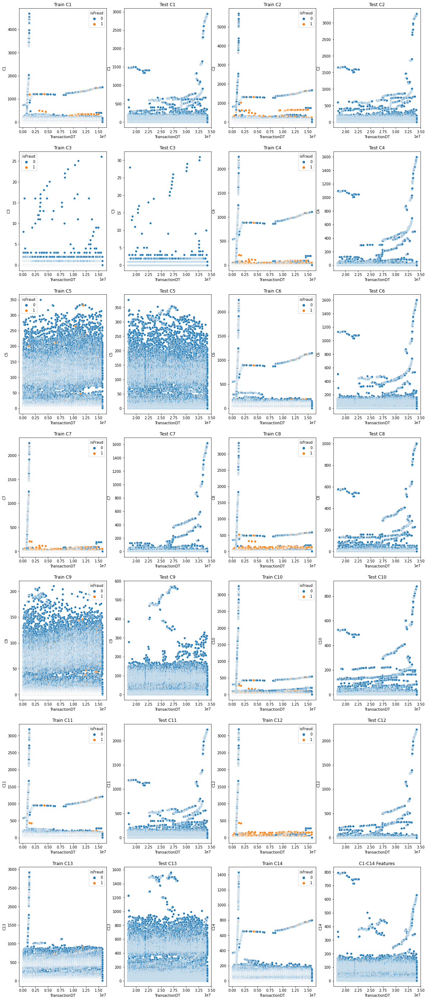

In [117]:
plt.figure(figsize = (20, 50))

var = ['C' + str(i) for i in range(1, 15)]
i = 1
for col in var:
    plt.subplot(7,4,i)
    sns.scatterplot(x = "TransactionDT", y = col, hue = "isFraud", data = train_df[~train_df[col].isnull()])
    plt.title('Train '+ col)
    i += 1

    plt.subplot(7,4,i)
    sns.scatterplot(x = "TransactionDT", y = col, data = test_df[~test_df[col].isnull()] )
    plt.title('Test '+ col)

    i += 1

plt.show();


Observation:

1) All features looks important, also No null values present in train data.

Few outliers are observed in train data, Let's remove outliers from C features

In [118]:
train_df.drop(train_df[train_df.C1 > 2500].index, axis=0, inplace=True)
train_df.drop(train_df[train_df.C2 > 2500].index, axis=0, inplace=True)
train_df.drop(train_df[train_df.C4 > 1400].index, axis=0, inplace=True)
train_df.drop(train_df[train_df.C6 > 1400].index, axis=0, inplace=True)
train_df.drop(train_df[train_df.C7 > 1400].index, axis=0, inplace=True)
train_df.drop(train_df[train_df.C8 > 2000].index, axis=0, inplace=True)
train_df.drop(train_df[train_df.C10 > 2000].index, axis=0, inplace=True)
train_df.drop(train_df[train_df.C11 > 2000].index, axis=0, inplace=True)
train_df.drop(train_df[train_df.C12 > 2000].index, axis=0, inplace=True)
train_df.drop(train_df[train_df.C13 > 1800].index, axis=0, inplace=True)
train_df.drop(train_df[train_df.C14 > 800].index, axis=0, inplace=True)

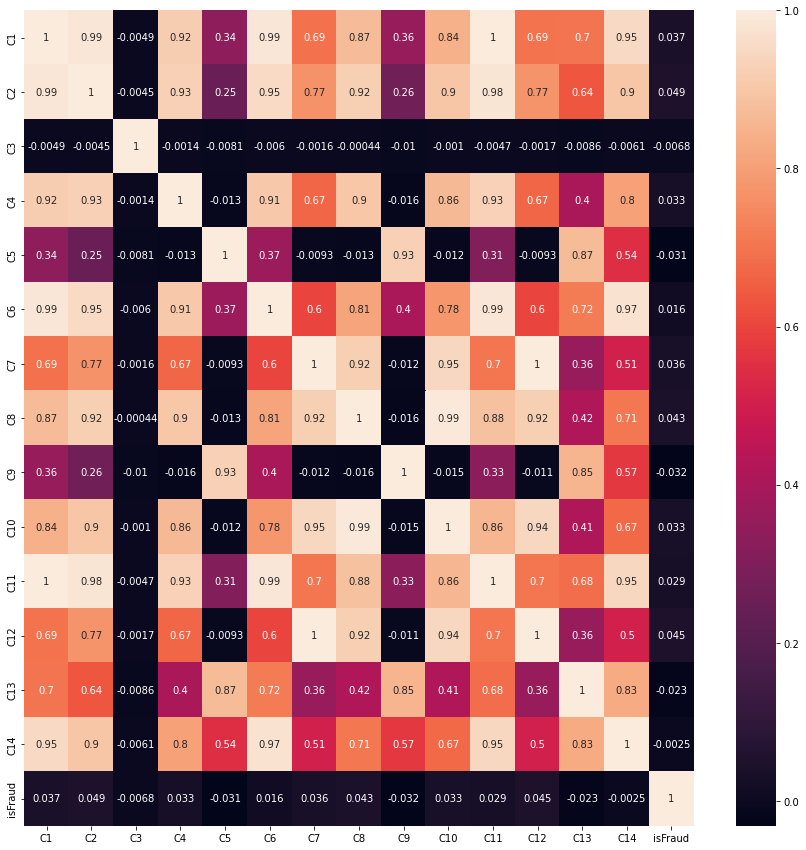

In [119]:
#Many C features have similar data distribution. Lets see correlated features
c_cols = train_df[['C1','C2','C3','C4','C5','C6','C7','C8','C9','C10','C11','C12','C13','C14','isFraud']]
f = c_cols.corr()
plt.figure(1,figsize = (15,15))
sns.heatmap(f,annot = True)
plt.show();


Observation:

1) From the scatter plot it is confirm that many C features have similar distribution. Most of the values in C1 lies near to 0.


2) Few outliers are observerd in some of features in dataset, C5 and C9 don't have any outliers. We have removed them while building the outliers.

3) All these feature have integral values with equal intervals and majority of the values corresponding to the C_features are 0.

4) Some C features seems to be highly inter-correlated.


# 2.10 D1-D15: 

These are numerical features.

Timedelta, such as days between previous transaction, etc.

The hour of the day is D9: train['D9'] = (train['TransactionDT']%(3600*24)/3600//1)/24.0.



Reference source :https://www.kaggle.com/c/ieee-fraud-detection/discussion/100400#latest-579480

In [120]:
train_df.iloc[:, 31:46].head()

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0
1,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0
2,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0
3,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0
4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [121]:
Dvalues = ['D1','D2','D3','D4','D5','D6','D7','D8','D9','D10','D11','D12','D13','D14','D15']

for i in Dvalues:
    print(train_df[i].describe())

count    588707.0
mean          NaN
std           NaN
min           0.0
25%           0.0
50%           3.0
75%         122.0
max         640.0
Name: D1, dtype: float64
count    309574.0
mean          NaN
std           NaN
min           0.0
25%          26.0
50%          97.0
75%         276.0
max         640.0
Name: D2, dtype: float64
count    327429.0
mean          NaN
std           NaN
min           0.0
25%           1.0
50%           8.0
75%          27.0
max         819.0
Name: D3, dtype: float64
count    421065.0
mean          NaN
std           NaN
min        -122.0
25%           0.0
50%          26.0
75%         254.0
max         869.0
Name: D4, dtype: float64
count    280419.0
mean          NaN
std           NaN
min           0.0
25%           1.0
50%          10.0
75%          32.0
max         819.0
Name: D5, dtype: float64
count    72647.0
mean         NaN
std          NaN
min        -83.0
25%          0.0
50%          0.0
75%         40.0
max        873.0
Name: D6, dtype: fl

Observation:

Some D features contain few negative values. Since D features represent some time references and it can't be negative. We need to remove them before building a model.

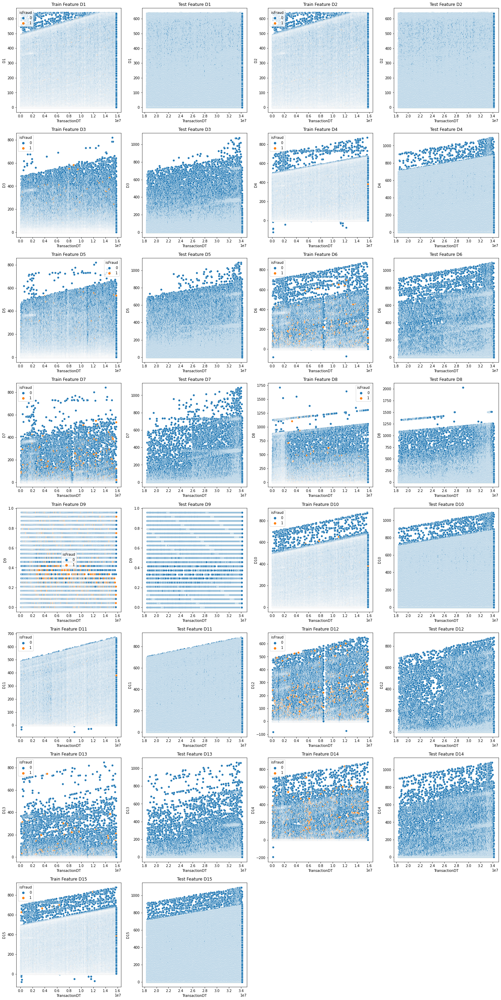

In [122]:
plt.figure(figsize = (25,52))

vars = ['D' + str(i) for i in range(1,16)]
i = 1
for col in vars:
    plt.subplot(8,4,i)
    sns.scatterplot(x = "TransactionDT", y = col, hue = "isFraud", data = train_df[~train_df[col].isnull()])
    plt.title('Train Feature '+col)
    i += 1


    plt.subplot(8,4,i)
    sns.scatterplot(x = "TransactionDT", y = col, data = test_df[~test_df[col].isnull()])
    plt.title('Test Feature '+col)
    i += 1

plt.show();

Observation:

Most of D features are graphically increasing with TransactionDT as the number of days between previous transaction (time period) increases.

# 2.11 M1-M9: 

1) These are categorical features.

2) Match, such as names on card and address, etc.

3) Majority of transactions have missing values corresponding to these features.

4) Most of the features have T, F or NaN values expect for M4. M4 feature has different values with values like M2 and M0.



In [123]:
#M features value samples

m_cols = [c for c in train_df if c[0] == 'M']
train_df[m_cols].head()


,M1,M2,M3,M4,M5,M6,M7,M8,M9
0,T,T,T,M2,F,T,NaN,NaN,NaN
1,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN
2,T,T,T,M0,F,F,F,F,F
3,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


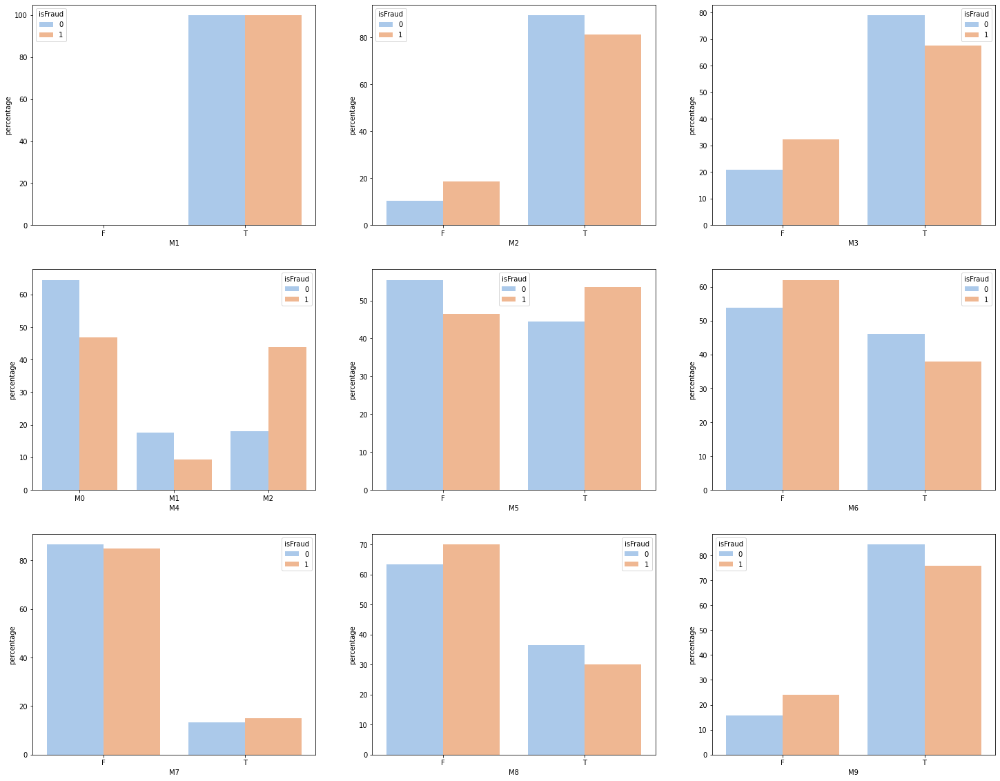

In [124]:
plt.figure(figsize = (25,20))

var = ['train_m' + str(i) for i in range(1,10)]
col = ['M' + str(i) for i in range(1,10)]

for i, j, k in zip( var, col, range(1,10)):

    i = (train_df.groupby(['isFraud'])[j]
         
                         .value_counts(normalize = True)
                         .rename('percentage')
                         .mul(100)
                         .reset_index()
                         .sort_values(j))
    
    plt.subplot(3,3,k)
    sns.barplot(x = j, y = "percentage", hue = "isFraud", data = i, palette = 'pastel')

plt.show();

Observations:

1) Feature M1 is useless beacause it doesn't contribute in classification of legit/fraud transactions.

2) M7 has very less contribution towards finding if a transaction is fraud and legit.

#2.12 Vxxx: 
These are numerical features

Vesta engineered rich features, including ranking, counting, and other entity relations.

“For example, how many times the payment card associated with a IP and email or address appeared in 24 hours time range, etc.”


Since we have total 339 V features we can not visualize them one by one.
Lets take a took at max values, count and unique values.
Based on feature importance we can keep features and remove which does not contribute in model performance




In [125]:
v_feature = [c for c in train_df if c[0] == 'V']
train_df[v_feature].head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [126]:
train_df[v_feature].describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,311240.0,311240.0,311240.0,311240.0,311240.0,311240.0,311240.0,311240.0,311240.0,311240.0,311240.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,514450.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,421018.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,512893.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,500815.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.0,589662.000000,589662.000000,589662.000000,589662.0,589662.0,589662.0,589662.000000,589662.000000,589662.000000,589662.000000,589662.000000,589662.000000,81943.0,81943.0,81943.0,81943.0,81943.0,81949.0,81949.0,81949.0,81943.0,81943.0,81943.0,81943.0,81949.0,81949.0,81949.0,81943.0,81943.0,81943.0,81943.0,81943.0,81943.0,81949.0,81949.000000,81943.0,81943.0,81943.0,81949.00000,81949.000000,81949.000000,139158.0,139158.0,139346.0,139346.0,139346.0,139158.0,139158.0,139346.0,139346.0,139158.0,139158.0,139158.0,139158.0,139346.0,139158.0,139158.0,139158.0,139346.0,139346.0,139158.0,139158.0,139346.0,139346.0,139158.0,139158.0,139158.0,139158.0,139346.0,139346.0,139158.0,139346.0,139346.0,139158.0,139346.0,139346.0,139158.000000,139158.000000,139158.000000,139158.0,139158.0,139158.0,139346.0,139346.0,139346.0,139158.000000,139158.000000,139158.000000,139158.000000,139158.000000,139158.000000,130007.0,130007.0,130007.0,140946.0,140946.0,140946.0,130007.0,130007.0,130007.0,130007.0,140946.0,130007.0,130007.0,130007.0,130007.0,130007.0,130007.0,140946.0,130007.0,130007.0,130007.0,140946.0,140946.0,130007.0,130007.0,130007.0,130007.0,130007.0,140946.0,130007.0,130007.0,130007.0,130007.0,140946.0,140946.0,130007.0,130007.0,130007.0,140946.0,140946.0,130007.0,130007.0,1409

In [127]:
for f in v_feature:
    print('\n',"="*8,f,"="*8,'\n')
    
    len_unique_cat = len(np.unique(train_df[f]))
    Topvaluecount = train_df[f].value_counts().head(1)
    print("Top value count: ",Topvaluecount)
    print("\n{} feature has {} unique categories\n".format(f, len_unique_cat))


 ======== V1 ======== 

Top value count:  1.0    311223
Name: V1, dtype: int64

V1 feature has 3 unique categories


 ======== V2 ======== 

Top value count:  1.0    298883
Name: V2, dtype: int64

V2 feature has 10 unique categories


 ======== V3 ======== 

Top value count:  1.0    290572
Name: V3, dtype: int64

V3 feature has 11 unique categories


 ======== V4 ======== 

Top value count:  1.0    246489
Name: V4, dtype: int64

V4 feature has 8 unique categories


 ======== V5 ======== 

Top value count:  1.0    242872
Name: V5, dtype: int64

V5 feature has 8 unique categories


 ======== V6 ======== 

Top value count:  1.0    298616
Name: V6, dtype: int64

V6 feature has 11 unique categories


 ======== V7 ======== 

Top value count:  1.0    291474
Name: V7, dtype: int64

V7 feature has 11 unique categories


 ======== V8 ======== 

Top value count:  1.0    303455
Name: V8, dtype: int64

V8 feature has 10 unique categories


 ======== V9 ======== 

Top value count:  1.0    299614
Na

Observation(s):

1) Some V features have more than 70% missing values as checked initally.

2) Majority of these features has majority value count as 0 and 1.

3) Some V features are have high NaN values.


#2.13 DeviceType 
This feature is the categorical feature.

Represents the type of device used for transaction

In [128]:
train_df["DeviceType"].dtype

dtype('O')

In [129]:

train_df['DeviceType'].isnull().sum()


449639

In [130]:
train_df['DeviceType'].describe()

count      140337
unique          2
top       desktop
freq        84874
Name: DeviceType, dtype: object

In [131]:
train_df['DeviceType'].value_counts()

desktop    84874
mobile     55463
Name: DeviceType, dtype: int64

In [132]:
train_df['DeviceType'].unique()

array([nan, 'mobile', 'desktop'], dtype=object)

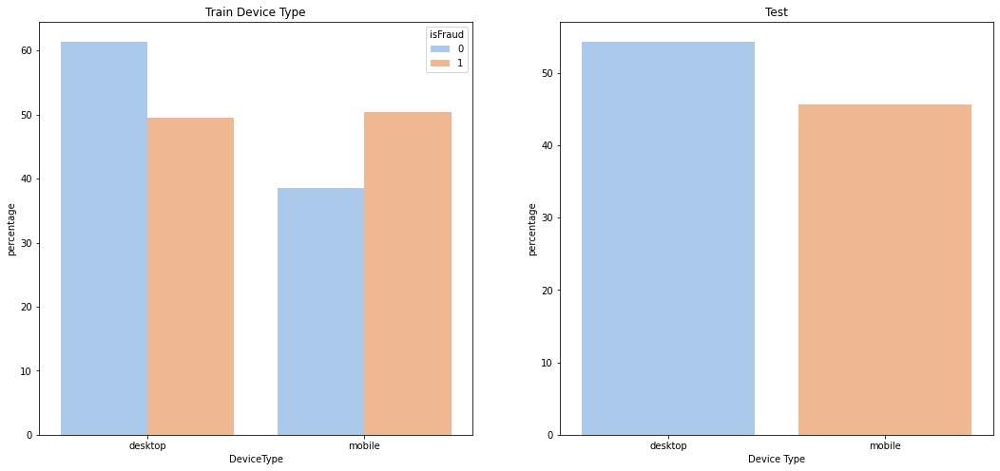

In [133]:
plt.figure(figsize = (18,8))

plt.subplot(1,2,1)

train_DeviceType = (train_df[~train_df['DeviceType'].isnull()].groupby(['isFraud'])['DeviceType'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('DeviceType'))
sns.barplot(x = "DeviceType", y = "percentage", hue = "isFraud", data = train_DeviceType, palette = 'pastel')
plt.title('Train Device Type')

plt.subplot(1,2,2)

test_DeviceType = test_df[~test_df['DeviceType'].isnull()]['DeviceType'].value_counts(normalize = True).mul(100).rename('percentage').reset_index()

sns.barplot( x = "index", y = "percentage", data=test_DeviceType, palette = 'pastel')
plt.xlabel('Device Type')
plt.title('Test')

plt.show()

Observations:

 1) Transactions by mobile devices are more fraudulent.

 2) DeviceType info is not present for majority of transactions.

 3) Count of desktop DeviceType is more compared to mobile in both train and test dataset.
 

# 2.14 DeviceInfo 

It is the categorical varible.

Contains information about device, os used.

In [134]:
train_df["DeviceInfo"].dtype

dtype('O')

In [135]:
train_df['DeviceInfo'].isnull().sum()

471658

In [136]:
train_df['DeviceInfo'].describe()

count      118318
unique       1784
top       Windows
freq        47550
Name: DeviceInfo, dtype: object

In [137]:
# Top 5 DeviceInfo Value Counts

train_df['DeviceInfo'].value_counts()[:5]

Windows        47550
iOS Device     19781
MacOS          12573
Trident/7.0     7428
rv:11.0         1899
Name: DeviceInfo, dtype: int64

Observations:

Majority of transactions are done by windows.


In [138]:
train_df['DeviceInfo'].nunique()

1784

In [139]:

DeviceTypetrain = train_df.groupby(['isFraud'])['DeviceInfo'].value_counts(normalize = True).rename('percentage').mul(100)
DeviceTypetrain


isFraud  DeviceInfo                                 
0        Windows                                        40.494347
         iOS Device                                     16.892157
         MacOS                                          11.201611
         Trident/7.0                                     6.679968
         rv:11.0                                         1.660881
         rv:57.0                                         0.775321
         SM-J700M Build/MMB29K                           0.440047
         SM-G610M Build/MMB29K                           0.383561
         SM-G531H Build/LMY48B                           0.341651
         rv:59.0                                         0.289720
         SM-G532M Build/MMB29T                           0.276054
         SM-G935F Build/NRD90M                           0.275143
         SM-G955U Build/NRD90M                           0.268766
         ALE-L23 Build/HuaweiALE-L23                     0.257833
         SM-G930V Build

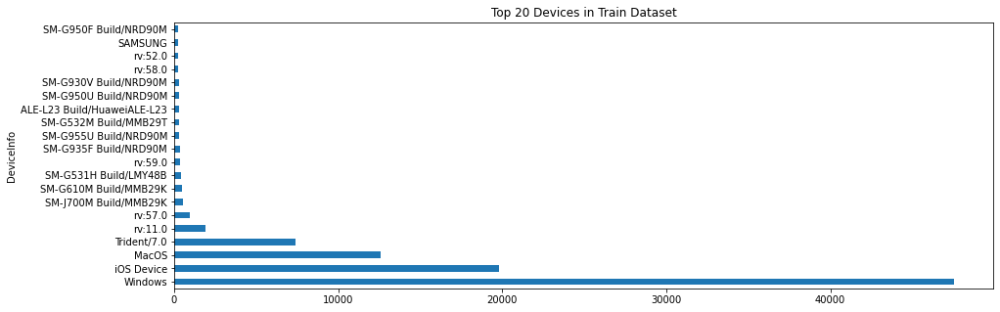

In [140]:
train_df.groupby('DeviceInfo') \
    .count()['TransactionID'] \
    .sort_values(ascending = False) \
    .head(20) \
    .plot(kind = 'barh', figsize = (15 , 5), title = 'Top 20 Devices in Train Dataset')
    
plt.show()


Obervations:

1) There are 1786 different types of device used for transactions.

2) Majority of transactions were done by Windows device.

3) Important feature in classifiying legit and fradulent transactions.

4) This feature contains info about device brand and its version, will creat two new feature in FE.

#2.15 id_01 to id_11

These are numerical features for identity, which is collected by Vesta and security partners such as device rating, ip_domain rating, proxy rating, etc.



Also, these features recorded behavioral fingerprint like account login times/failed to login times, how long an account stayed on the page, etc. 

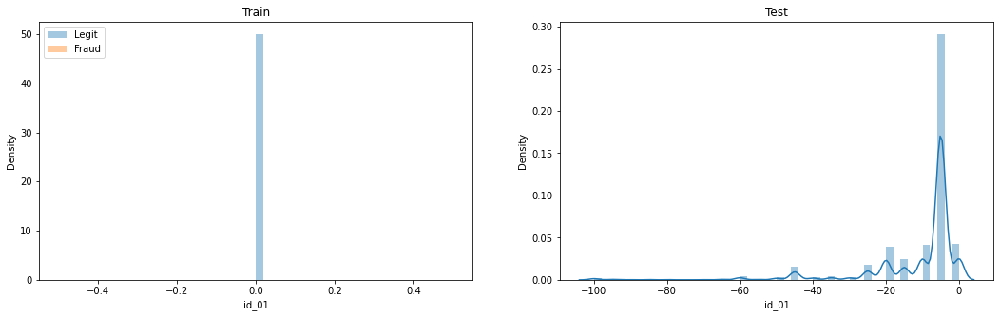

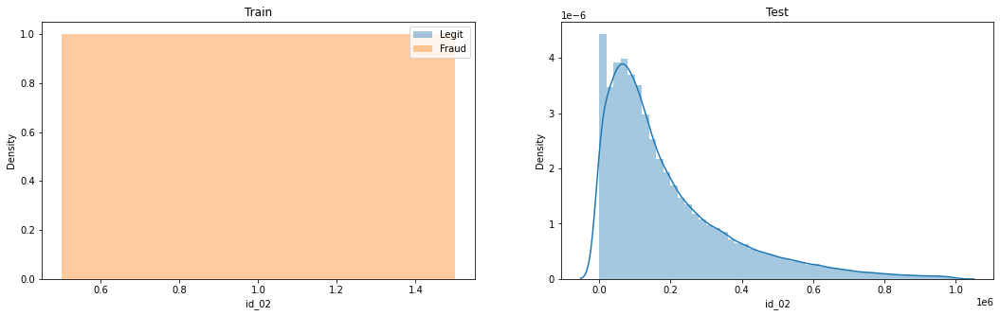

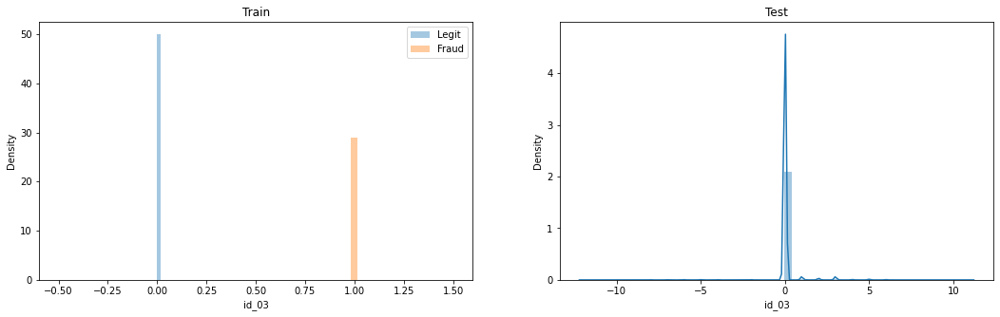

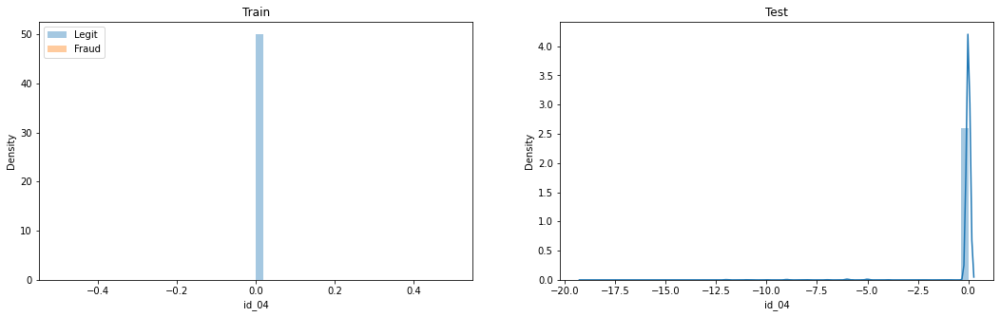

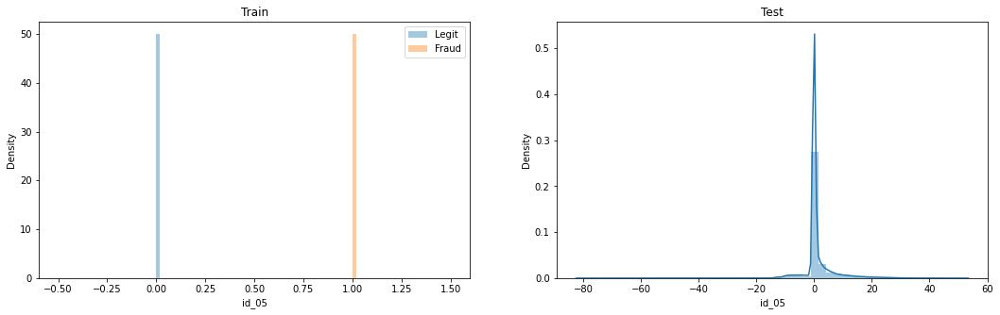

...

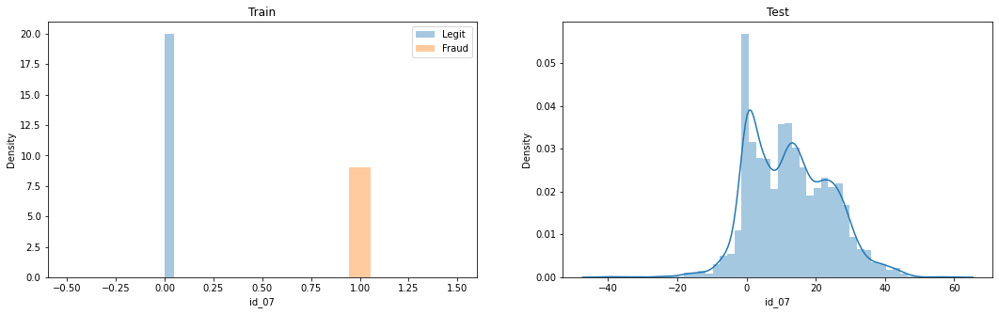

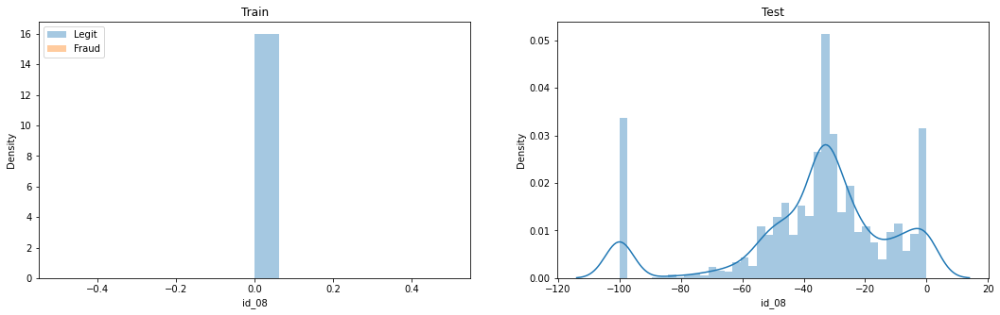

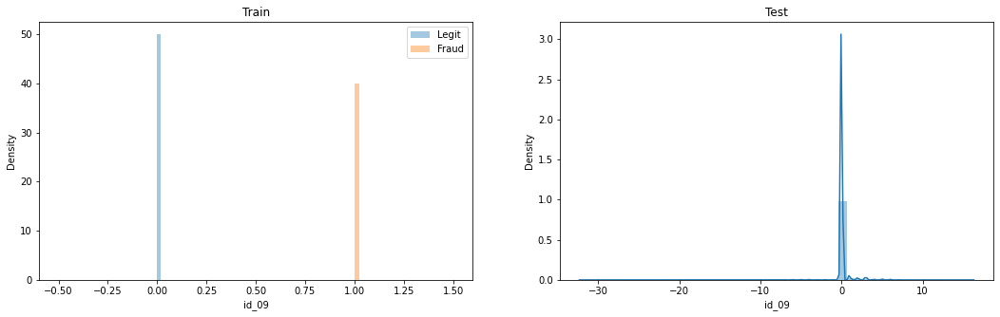

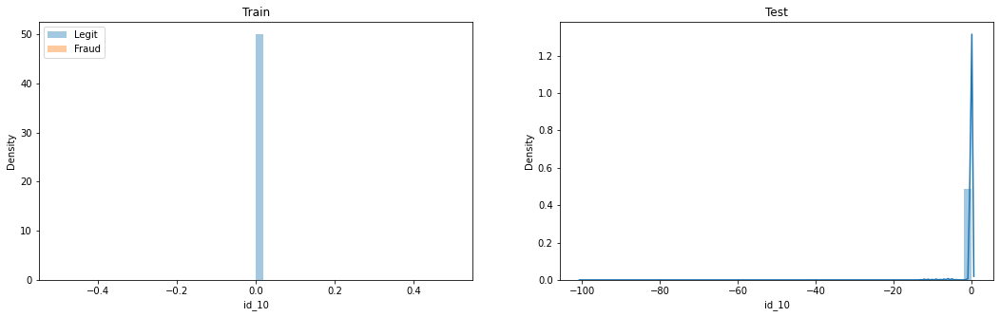

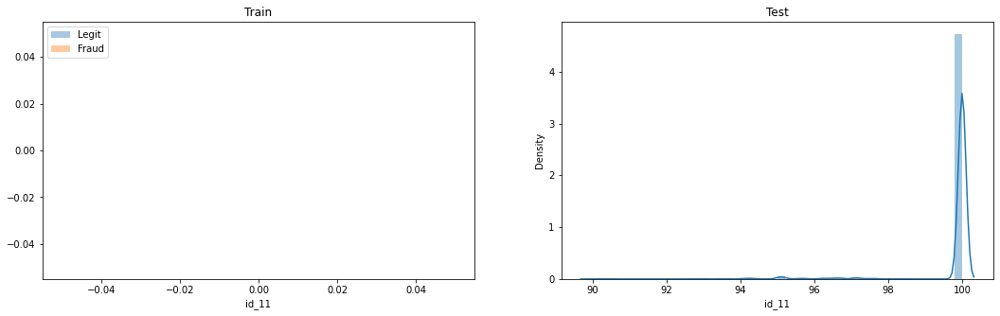

In [141]:
for i in ['01','02','03','04','05','06','07','08','09','10','11']:
   plt.figure(figsize = (18,5))
   plt.subplot(1,2,1)
   sns.distplot(train_df[train_df["id_"+i] == 0]["id_"+i], label = "Legit")

   sns.distplot(train_df[train_df["id_"+i] ==1 ]["id_"+i], label = "Fraud")
   plt.legend()
   plt.title("Train")


   plt.subplot(1,2,2)
   sns.distplot(test_df["id_"+i])
   plt.title("Test")
   plt.show()
   print("="*90)

Observation:

1) We need to remove some id_x features because that does not take part in the classification, they have only one class of values. 

2) But other seems important in identifying the transaction status.

#2.16 Id 12 - 38

These are categorical data. 

It contains network connection information, browser information etc.

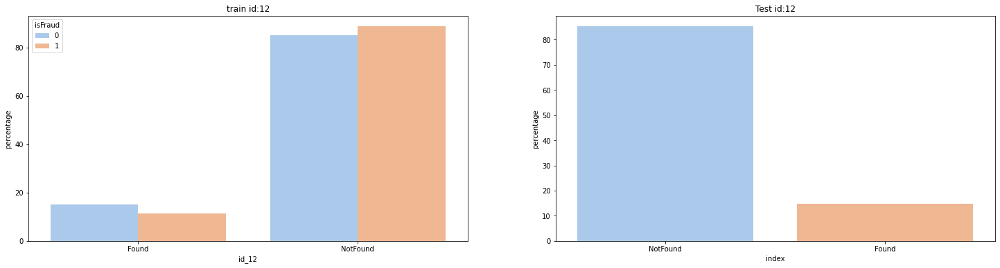

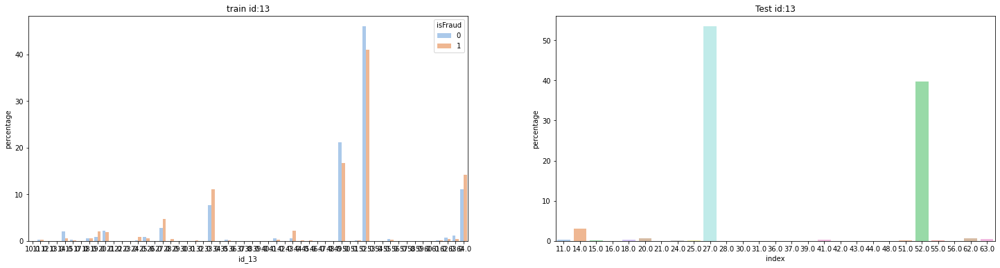

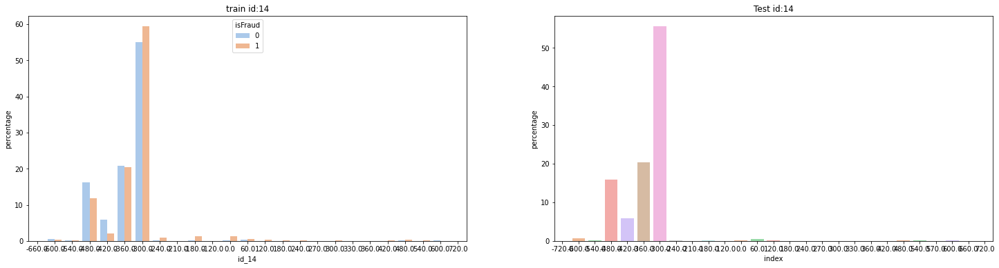

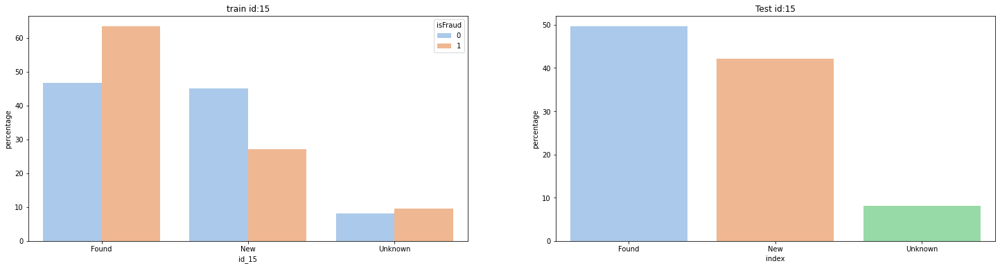

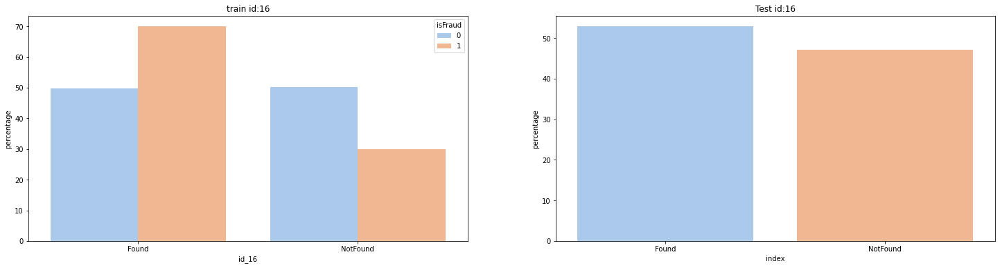

...

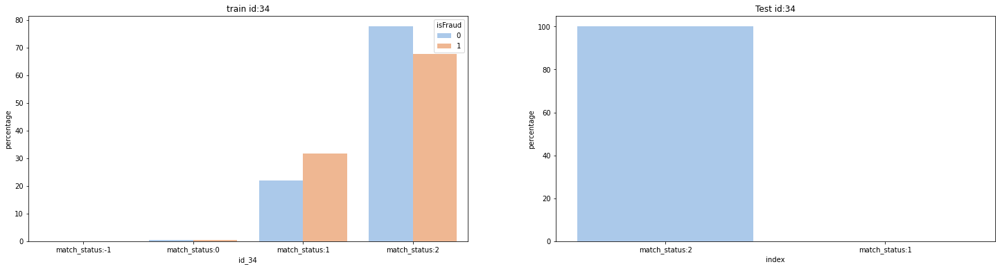

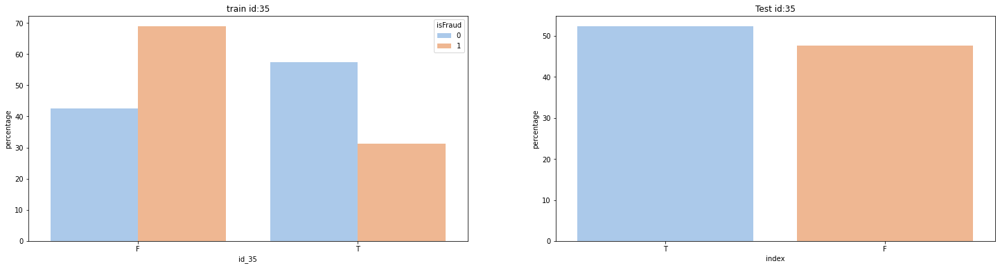

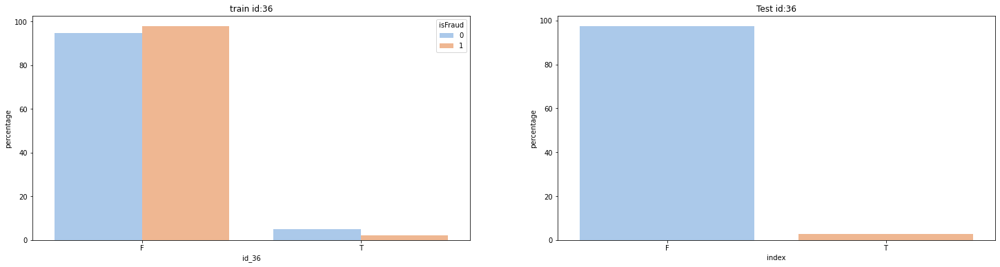

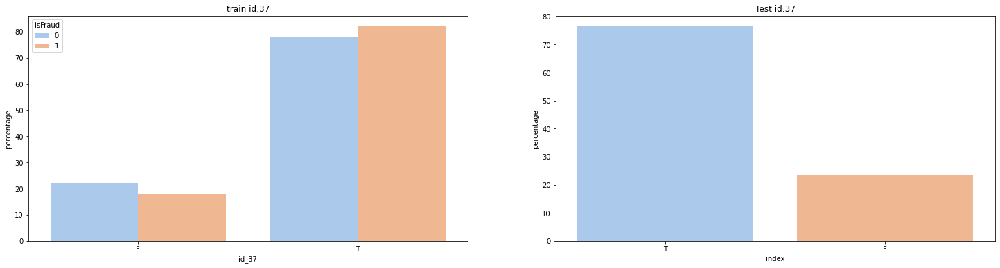

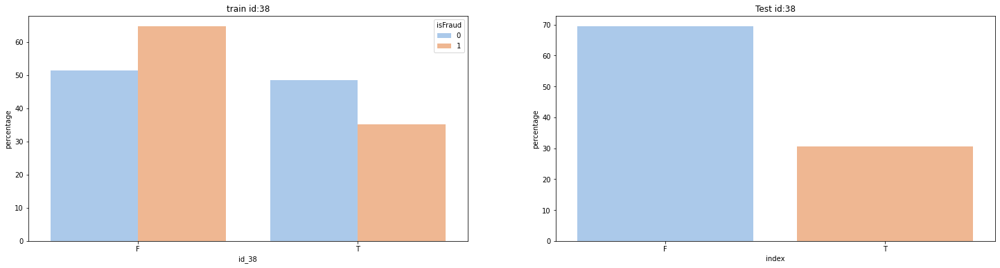

In [142]:
for i in range(12,39):

    plt.figure(figsize = (25,6))

    plt.subplot(1,2,1)

    temp = train_df.groupby(['isFraud'])['id_'+str(i)].value_counts(normalize = True).rename('percentage').mul(100).reset_index().sort_values('id_'+str(i))

    sns.barplot(x = "id_"+str(i), y = "percentage", hue = "isFraud", data = temp, palette = 'pastel')
    plt.title('train id:'+str(i))

    plt.subplot(1,2,2)

    temp_test = test_df['id_'+str(i)].value_counts(normalize = True).mul(100).rename('percentage').reset_index()
    sns.barplot(x = "index", y = "percentage", data = temp_test, palette = 'pastel')

    plt.title('Test id:'+str(i))
    plt.show();
    
    print("="*112)


Observations:

1) Some of the id_x features are useful to separate legit transactions from graud transactions but some are useless features.

2) Most of these features contains Found, Not Found values

3) Id-27 is not useful, as it doesn't contribute in classification.

Other than the categorical variables above, let's take a closer look to the id 30, 31, 33 as well since they are object datatype

In [143]:
print(train_df['id_30'].value_counts()[:10])
print("===================================")
print(test_df['id_30'].value_counts()[:10])


Windows 10          21154
Windows 7           13110
iOS 11.2.1           3722
iOS 11.1.2           3699
Android 7.0          2871
Mac OS X 10_12_6     2559
Mac OS X 10_11_6     2348
iOS 11.3.0           2016
Windows 8.1          1914
Mac OS X 10_10_5     1651
Name: id_30, dtype: int64
Windows 10          21015
Windows 7           10368
iOS 12.1.0           6349
iOS 11.4.1           3538
Mac OS X 10_13_6     3254
Android 8.0.0        2455
iOS 12.0.1           1691
iOS 11.4.0           1605
Mac OS X 10_11_6     1454
Windows 8.1          1394
Name: id_30, dtype: int64


Id_30 represents the os and its version.

In [144]:
#train data id_30 feature split
train_df['OS_id_30'] = train_df['id_30'].str.split(' ', expand = True)[0]
train_df['version_id_30'] = train_df['id_30'].str.split(' ', expand = True)[1]

#test data id_30 feature split
test_df['OS_id_30'] = test_df['id_30'].str.split(' ', expand = True)[0]
test_df['version_id_30'] = test_df['id_30'].str.split(' ', expand = True)[1]

In [145]:
print(train_df['id_31'].value_counts()[:10])
print("===================================")
print(test_df['id_31'].value_counts()[:10])


chrome 63.0                21873
mobile safari 11.0         13394
mobile safari generic      11468
ie 11.0 for desktop         9016
safari generic              8181
chrome 62.0                 7091
chrome 65.0                 6870
chrome 64.0                 6711
chrome 63.0 for android     5776
chrome generic              4767
Name: id_31, dtype: int64
chrome 70.0                16054
mobile safari 12.0         13098
mobile safari 11.0         10232
chrome 71.0                 9489
chrome 69.0                 8293
chrome 70.0 for android     7624
chrome 68.0                 6449
chrome 67.0                 6122
chrome 69.0 for android     6022
ie 11.0 for desktop         5173
Name: id_31, dtype: int64


As we can id_31 describe which version of the browser people are using.

Chrome 65.0 is the latest browser in the train data where as Chrome 71.0 is the latest browser in the test data.

In [146]:
def id31_split(dataframe):
    dataframe['browser_id_31'] = dataframe['id_31'].str.split(' ', expand=True)[0]
    dataframe['version_id_31'] = dataframe['id_31'].str.split(' ', expand=True)[1]

In [147]:
id31_split(train_df)

In [148]:
id31_split(test_df)

In [149]:
print(train_df['id_33'].value_counts()[:10])
print("===================================")
print(test_df['id_33'].value_counts()[:10])


1920x1080    16874
1366x768      8605
1334x750      6447
2208x1242     4900
1440x900      4384
1600x900      3510
2048x1536     3482
1280x800      2149
2560x1600     2093
2560x1440     1865
Name: id_33, dtype: int64
1920x1080    16868
1366x768      6441
1334x750      5103
2208x1242     4213
1440x900      3743
1600x900      3093
2048x1536     3074
2436x1125     2746
2880x1800     1888
2560x1600     1778
Name: id_33, dtype: int64


Observation:

id_33 represents the width of the screen.

In [150]:
def id33_split(dataframe):
    dataframe['screen_width'] = dataframe['id_33'].str.split('x', expand = True)[0]
    dataframe['screen_height'] = dataframe['id_33'].str.split('x', expand = True)[1]

In [151]:
id33_split(train_df)
id33_split(test_df)

Observations:

1) Some of the id_x features are useful to separate legit transactions from fraud transactions but some are useless features.

2) Id-27 is not useful as its not contributing in classification

3) Most of Id features have T, F, found non found values

In [153]:
# saving the analysed dataset into new csv file.
train_df.to_csv("/content/drive/My Drive/Colab Notebooks/Fraud-Detection/train_afterEDA.csv", index=False)
test_df.to_csv("/content/drive/My Drive/Colab Notebooks/Fraud-Detection/test_afterEDA.csv", index=False)

=================================END OF EDA====================================